In [ ]:
!gdown --id 1WFmPIGS5AceGMJRshzciS6jcwN8me4Ke

/usr/local/lib/python3.11/dist-packages/gdown/__main__.py:140: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From (original): https://drive.google.com/uc?id=1WFmPIGS5AceGMJRshzciS6jcwN8me4Ke
From (redirected): https://drive.google.com/uc?id=1WFmPIGS5AceGMJRshzciS6jcwN8me4Ke&confirm=t&uuid=ce60e300-35fd-4607-ba4c-8e49594de7aa
To: /content/images.zip
100% 1.40G/1.40G [00:26<00:00, 52.7MB/s]


In [ ]:
!gdown --id 1y4R4T7UGJy-TXCJ4nqpHUE8L7j81HgkC

/usr/local/lib/python3.11/dist-packages/gdown/__main__.py:140: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From: https://drive.google.com/uc?id=1y4R4T7UGJy-TXCJ4nqpHUE8L7j81HgkC
To: /content/cytologia-data-1732098640162.csv
100% 1.82M/1.82M [00:00<00:00, 139MB/s]


In [ ]:
import zipfile
with zipfile.ZipFile('/content/images.zip', 'r') as zip_ref:
    zip_ref.extractall('/content/Images')

In [ ]:
import os
import json
import pandas as pd
from tqdm import tqdm

In [ ]:
# Paths
csv_path = '/content/cytologia-data-1732098640162.csv'
images_path = '/content/Images/dataset_cytologia'

df = pd.read_csv(csv_path)

print(df.head())


             NAME   x1   y1   x2   y2 class
0  cf7734a2-b.jpg   99   88  266  276   PNN
1  e6a3b579-0.jpg   92   78  272  284    MO
2  60f95776-f.jpg  110  103  251  251    MM
3  0894e581-c.jpg  112  121  248  262   LyB
4  3998a979-3.jpg   94   86  276  281    MO


In [ ]:
df['class'].nunique()

23

In [ ]:
df['class'].unique()

array(['PNN', 'MO', 'MM', 'LyB', 'LGL', 'Thromb', 'LLC', 'LAM3', 'EO',
       'LY', 'BA', 'MoB', 'LM', 'LH_lyAct', 'Lysee', 'Er', 'LF', 'LZMG',
       'MBL', 'SS', 'PM', 'B', 'M'], dtype=object)

In [ ]:
df.shape

(52748, 6)

In [ ]:
import pandas as pd
import numpy as np
import os
from PIL import Image
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.utils import to_categorical

## Quick Info

In [ ]:
# Paths
csv_path = '/content/cytologia-data-1732098640162.csv'
images_path = '/content/Images/dataset_cytologia'

# Load CSV
df = pd.read_csv(csv_path)

# Display first few rows
print("First few rows of the dataframe:")
print(df.head())

# Display class distribution
print("\nClass distribution:")
print(df['class'].value_counts())

# Check for missing values
print("\nMissing values:")
print(df.isnull().sum())

# Check data types
print("\nData types:")
print(df.dtypes)

First few rows of the dataframe:
             NAME   x1   y1   x2   y2 class
0  cf7734a2-b.jpg   99   88  266  276   PNN
1  e6a3b579-0.jpg   92   78  272  284    MO
2  60f95776-f.jpg  110  103  251  251    MM
3  0894e581-c.jpg  112  121  248  262   LyB
4  3998a979-3.jpg   94   86  276  281    MO

Class distribution:
class
PNN         6827
Lysee       3408
LAM3        3338
LLC         3158
LyB         3029
MO          2743
MBL         2668
LGL         2439
EO          2432
Thromb      2319
Er          2308
B           2263
LF          2131
LY          2092
M           1994
MM          1707
LH_lyAct    1705
MoB         1531
PM          1152
BA          1001
LM           944
LZMG         845
SS           714
Name: count, dtype: int64

Missing values:
NAME     0
x1       0
y1       0
x2       0
y2       0
class    0
dtype: int64

Data types:
NAME     object
x1        int64
y1        int64
x2        int64
y2        int64
class    object
dtype: object


## Initial Sample visualization

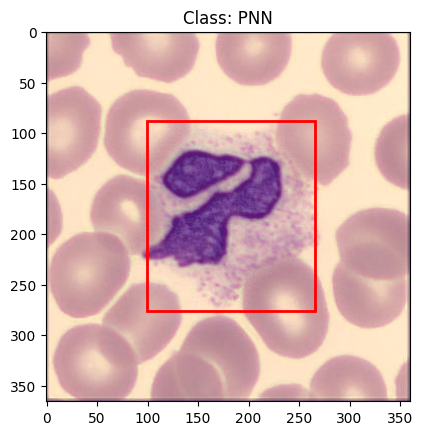

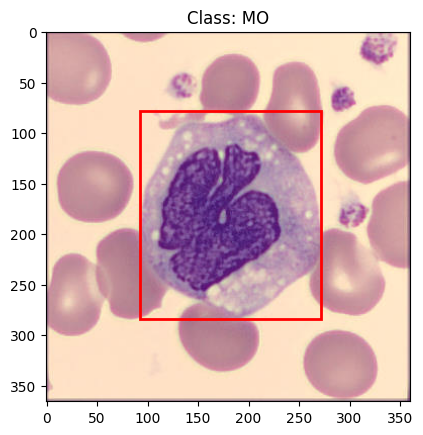

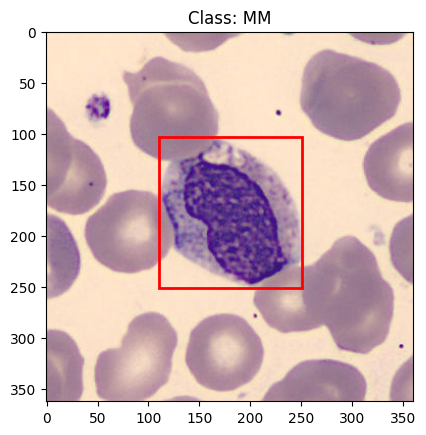

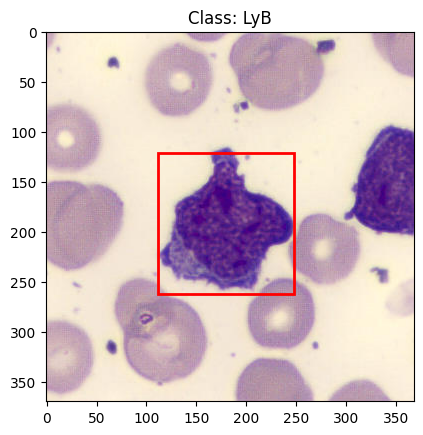

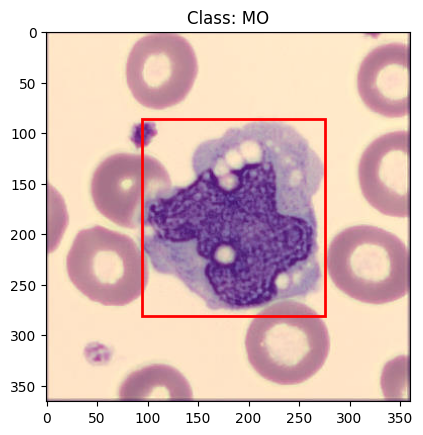

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image

# Function to display image with bounding boxes
def display_image_with_boxes(df, images_path, index=0):
    row = df.iloc[index]
    image_path = f"{images_path}/{row['NAME']}"
    image = Image.open(image_path)
    fig, ax = plt.subplots(1)
    ax.imshow(image)
    # Create a Rectangle patch
    rect = patches.Rectangle((row['x1'], row['y1']), row['x2'] - row['x1'], row['y2'] - row['y1'],
                             linewidth=2, edgecolor='r', facecolor='none')
    # Add the patch to the Axes
    ax.add_patch(rect)
    plt.title(f"Class: {row['class']}")
    plt.show()

# Display the first 5 images with bounding boxes
for i in range(5):
    display_image_with_boxes(df, images_path, index=i)


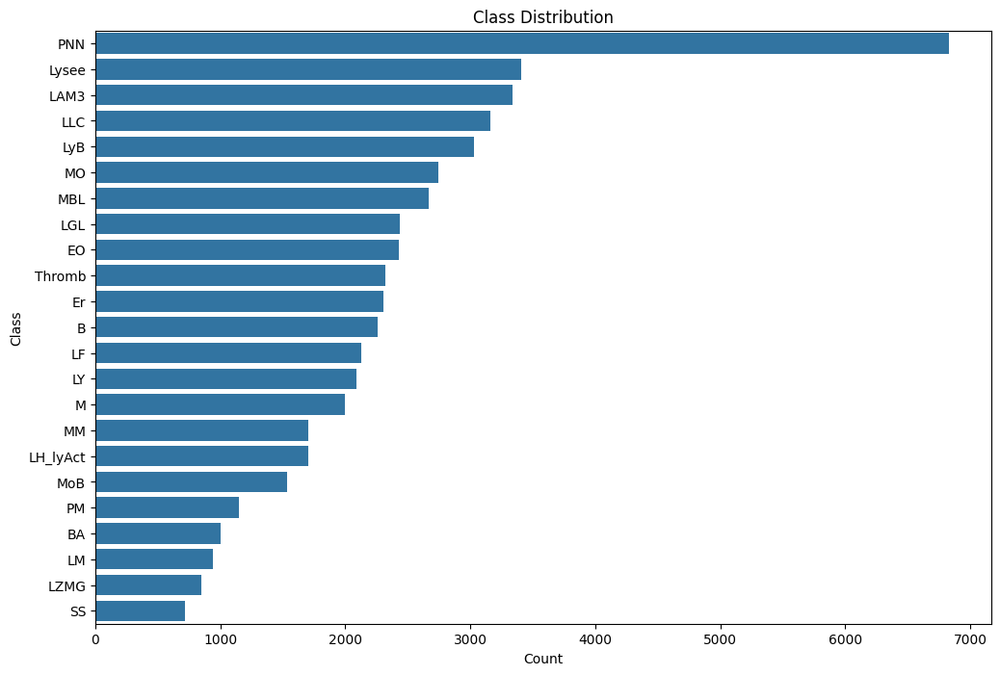

In [ ]:
import seaborn as sns

plt.figure(figsize=(12, 8))
sns.countplot(y='class', data=df, order=df['class'].value_counts().index)
plt.title('Class Distribution')
plt.xlabel('Count')
plt.ylabel('Class')
plt.show()


### Duplicates

In [ ]:
# Check for exact duplicate rows
exact_duplicates = df[df.duplicated()]
print(f"Number of exact duplicate rows: {exact_duplicates.shape[0]}")

if not exact_duplicates.empty:
    print("Exact duplicate rows found:")
    print(exact_duplicates.head())
else:
    print("No exact duplicate rows found.")


Number of exact duplicate rows: 0
No exact duplicate rows found.


In [ ]:
# Check for duplicate bounding boxes within the same image
bbox_duplicates = df[df.duplicated(subset=['NAME', 'x1', 'y1', 'x2', 'y2', 'class'], keep=False)]
print(f"Number of duplicate bounding box entries: {bbox_duplicates.shape[0]}")

if not bbox_duplicates.empty:
    print("Duplicate bounding box entries found:")
    print(bbox_duplicates.head())
else:
    print("No duplicate bounding box entries found.")


Number of duplicate bounding box entries: 0
No duplicate bounding box entries found.


In [ ]:
# Group by 'NAME', 'x1', 'y1', 'x2', 'y2'
duplicate_bboxes = (
    df.groupby(['NAME', 'x1', 'y1', 'x2', 'y2'])['class']
    .nunique()
    .reset_index()
)

# Filter groups with more than one unique class
duplicates_with_different_classes = duplicate_bboxes[duplicate_bboxes['class'] > 1]

# Merge back to the original dataframe to display the conflicting rows
conflicting_rows = pd.merge(
    df,
    duplicates_with_different_classes[['NAME', 'x1', 'y1', 'x2', 'y2']],
    on=['NAME', 'x1', 'y1', 'x2', 'y2']
)

print(f"Number of bounding boxes with multiple classes: {duplicates_with_different_classes.shape[0]}")
print("Sample conflicting rows:")
print(conflicting_rows.head())


Number of bounding boxes with multiple classes: 0
Sample conflicting rows:
Empty DataFrame
Columns: [NAME, x1, y1, x2, y2, class]
Index: []


# Number of bounding boxes inside other boxes with the same class

In [ ]:
import pandas as pd
import itertools

# Function to check if box A is inside box B
def is_contained(box_a, box_b):
    return (
        box_a['x1'] >= box_b['x1'] and
        box_a['y1'] >= box_b['y1'] and
        box_a['x2'] <= box_b['x2'] and
        box_a['y2'] <= box_b['y2']
    )

# Initialize a list to store contained bounding boxes
contained_boxes_same_class = []

# Group the DataFrame by image name
grouped = df.groupby('NAME')

# Iterate through each group (each image)
for image_name, group in grouped:
    # If there's only one bounding box in the image, skip
    if len(group) < 2:
        continue

    # Iterate through all unique pairs of bounding boxes
    for (idx_a, box_a), (idx_b, box_b) in itertools.combinations(group.iterrows(), 2):
        # Check if box A is inside box B and has the same class
        if is_contained(box_a, box_b) and box_a['class'] == box_b['class']:
            contained_boxes_same_class.append({
                'Image': image_name,
                'Contained_Box_Index': idx_a,
                'Contained_Box_Coordinates': (box_a['x1'], box_a['y1'], box_a['x2'], box_a['y2']),
                'Container_Box_Index': idx_b,
                'Container_Box_Coordinates': (box_b['x1'], box_b['y1'], box_b['x2'], box_b['y2']),
                'Class': box_a['class']
            })
        # Check if box B is inside box A and has the same class
        elif is_contained(box_b, box_a) and box_b['class'] == box_a['class']:
            contained_boxes_same_class.append({
                'Image': image_name,
                'Contained_Box_Index': idx_b,
                'Contained_Box_Coordinates': (box_b['x1'], box_b['y1'], box_b['x2'], box_b['y2']),
                'Container_Box_Index': idx_a,
                'Container_Box_Coordinates': (box_a['x1'], box_a['y1'], box_a['x2'], box_a['y2']),
                'Class': box_b['class']
            })

# Convert the results to a DataFrame
contained_df_same_class = pd.DataFrame(contained_boxes_same_class)

# Display results
print(f"Number of bounding boxes inside other boxes with the same class: {contained_df_same_class.shape[0]}")
if not contained_df_same_class.empty:
    print("Sample contained boxes:")
    print(contained_df_same_class.head())


Number of bounding boxes inside other boxes with the same class: 3
Sample contained boxes:
            Image  Contained_Box_Index Contained_Box_Coordinates  \
0  069bced3-7.jpg                40268      (304, 187, 359, 281)   
1  735f9a9c-0.jpg                17317       (91, 151, 252, 284)   
2  f0cac2a6-1.jpg                 3810      (117, 181, 287, 348)   

   Container_Box_Index Container_Box_Coordinates Class  
0                37499       (267, 64, 360, 288)   LLC  
1                17639         (68, 2, 263, 296)    EO  
2                24795         (55, 8, 379, 348)   MoB  


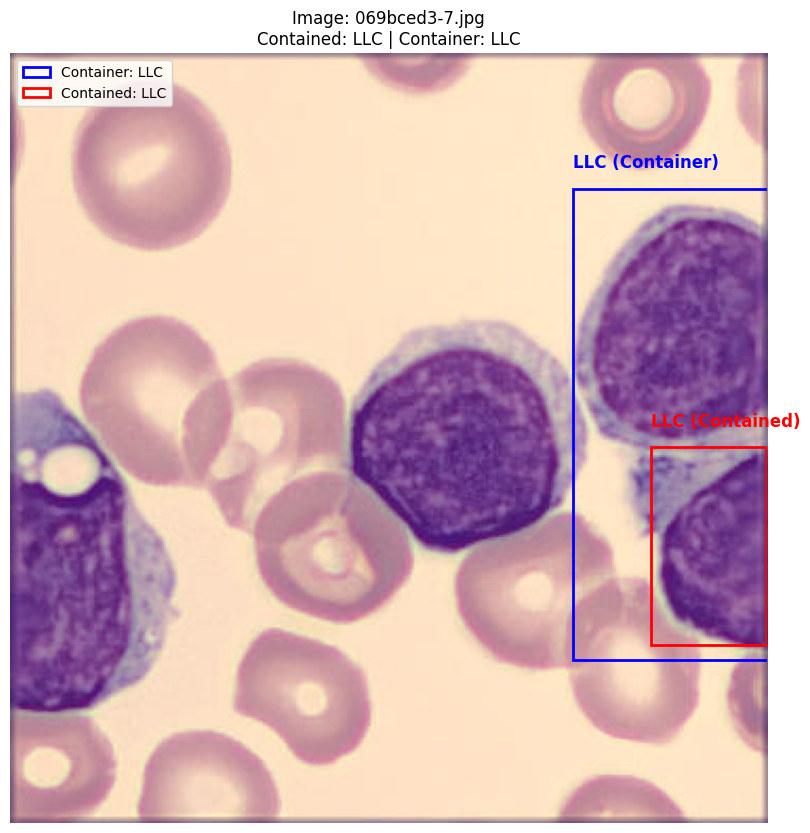

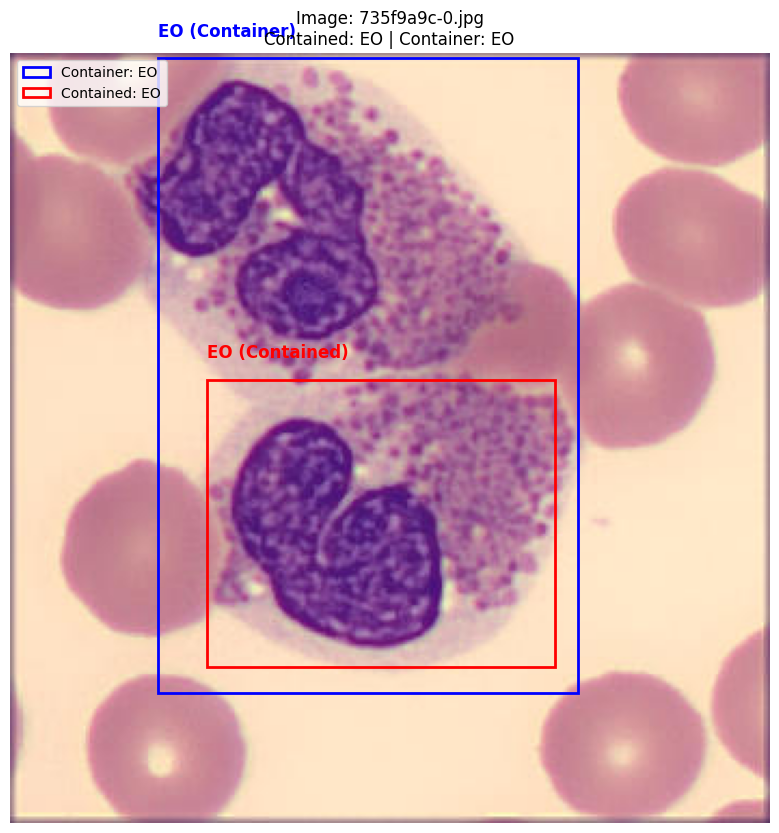

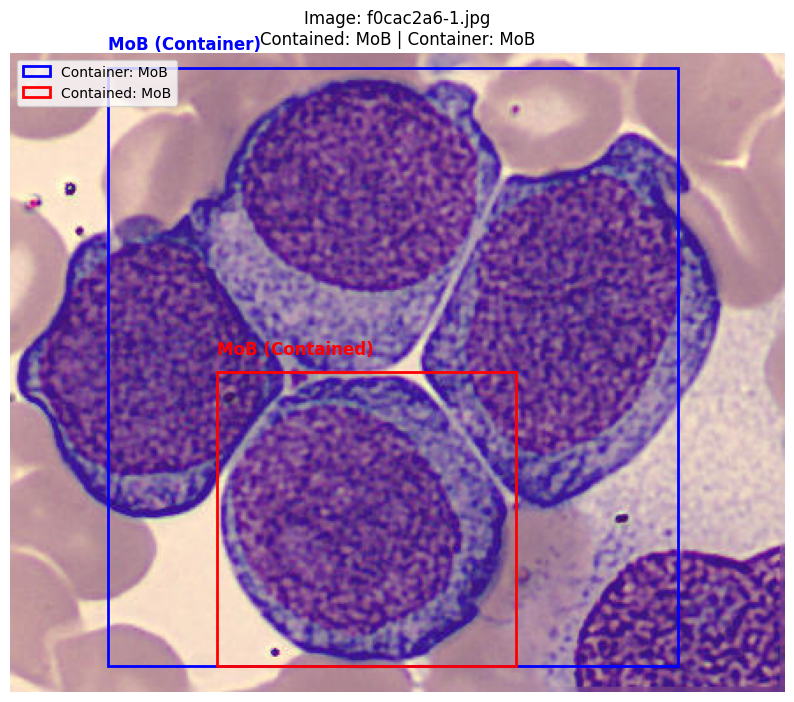

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image

def visualize_contained_boxes_same_class(contained_df_same_class, df, images_path, num_samples=5):
    """
    Visualize bounding boxes that are contained within other bounding boxes with the same class.

    Parameters:
    - contained_df_same_class: DataFrame with contained bounding boxes.
    - df: Original DataFrame with bounding box data.
    - images_path: Path to the directory containing images.
    - num_samples: Number of samples to visualize.
    """
    # Randomly select a subset of contained bounding boxes to visualize
    samples = contained_df_same_class.sample(n=min(num_samples, len(contained_df_same_class)), random_state=42)

    for _, row in samples.iterrows():
        image_name = row['Image']
        contained_idx = row['Contained_Box_Index']
        container_idx = row['Container_Box_Index']

        # Retrieve bounding box details
        contained_box = df.loc[contained_idx]
        container_box = df.loc[container_idx]

        # Load the image
        image_path = f"{images_path}/{image_name}"
        try:
            image = Image.open(image_path)
        except FileNotFoundError:
            print(f"Image not found: {image_path}")
            continue

        fig, ax = plt.subplots(1, figsize=(10, 10))
        ax.imshow(image)

        # Draw the container bounding box in blue
        rect_container = patches.Rectangle(
            (container_box['x1'], container_box['y1']),
            container_box['x2'] - container_box['x1'],
            container_box['y2'] - container_box['y1'],
            linewidth=2,
            edgecolor='blue',
            facecolor='none',
            label=f"Container: {container_box['class']}"
        )
        ax.add_patch(rect_container)

        # Draw the contained bounding box in red
        rect_contained = patches.Rectangle(
            (contained_box['x1'], contained_box['y1']),
            contained_box['x2'] - contained_box['x1'],
            contained_box['y2'] - contained_box['y1'],
            linewidth=2,
            edgecolor='red',
            facecolor='none',
            label=f"Contained: {contained_box['class']}"
        )
        ax.add_patch(rect_contained)

        # Annotate class labels
        ax.text(
            container_box['x1'], container_box['y1'] - 10,
            f"{container_box['class']} (Container)",
            color='blue', fontsize=12, fontweight='bold'
        )
        ax.text(
            contained_box['x1'], contained_box['y1'] - 10,
            f"{contained_box['class']} (Contained)",
            color='red', fontsize=12, fontweight='bold'
        )

        # Add legend
        plt.legend(loc="upper left")
        plt.title(f"Image: {image_name}\nContained: {contained_box['class']} | Container: {container_box['class']}")
        plt.axis('off')
        plt.show()

# Visualize up to 5 contained bounding boxes
if contained_df_same_class.empty:
    print("No contained bounding boxes with the same class to visualize.")
else:
    visualize_contained_boxes_same_class(contained_df_same_class, df, images_path, num_samples=5)


### Same bounding box different class

In [ ]:
import pandas as pd
import itertools

# Function to check if two boxes have identical coordinates
def is_identical(box_a, box_b):
    return (
        box_a['x1'] == box_b['x1'] and
        box_a['y1'] == box_b['y1'] and
        box_a['x2'] == box_b['x2'] and
        box_a['y2'] == box_b['y2']
    )

# Initialize a list to store boxes with identical coordinates but different classes
identical_diff_class_boxes = []

# Group the DataFrame by image name
grouped = df.groupby('NAME')

# Iterate through each group (each image)
for image_name, group in grouped:
    # If there's only one bounding box in the image, skip
    if len(group) < 2:
        continue

    # Iterate through all unique pairs of bounding boxes
    for (idx_a, box_a), (idx_b, box_b) in itertools.combinations(group.iterrows(), 2):
        if is_identical(box_a, box_b):
            if box_a['class'] != box_b['class']:
                identical_diff_class_boxes.append({
                    'Image': image_name,
                    'Box_A_Index': idx_a,
                    'Box_A_Coordinates': (box_a['x1'], box_a['y1'], box_a['x2'], box_a['y2']),
                    'Box_A_Class': box_a['class'],
                    'Box_B_Index': idx_b,
                    'Box_B_Coordinates': (box_b['x1'], box_b['y1'], box_b['x2'], box_b['y2']),
                    'Box_B_Class': box_b['class']
                })

# Convert the results to a DataFrame
identical_diff_class_df = pd.DataFrame(identical_diff_class_boxes)

# Display results
print(f"Number of bounding boxes with identical coordinates but different classes: {identical_diff_class_df.shape[0]}")
if not identical_diff_class_df.empty:
    print("\nSample identical boxes with different classes:")
    print(identical_diff_class_df.head())


Number of bounding boxes with identical coordinates but different classes: 0


# Number of overlapping bounding box pairs

In [ ]:
import pandas as pd
import itertools

# Function to calculate Intersection over Union (IoU)
def calculate_iou(box_a, box_b):
    # Check for invalid boxes
    if box_a['x2'] <= box_a['x1'] or box_a['y2'] <= box_a['y1']:
        return 0
    if box_b['x2'] <= box_b['x1'] or box_b['y2'] <= box_b['y1']:
        return 0

    # Coordinates of the intersection rectangle
    x1 = max(box_a['x1'], box_b['x1'])
    y1 = max(box_a['y1'], box_b['y1'])
    x2 = min(box_a['x2'], box_b['x2'])
    y2 = min(box_a['y2'], box_b['y2'])

    # Calculate intersection area
    intersection_area = max(0, x2 - x1) * max(0, y2 - y1)

    # Calculate areas of each box
    area_a = (box_a['x2'] - box_a['x1']) * (box_a['y2'] - box_a['y1'])
    area_b = (box_b['x2'] - box_b['x1']) * (box_b['y2'] - box_b['y1'])

    # Calculate union area
    union_area = area_a + area_b - intersection_area

    # Calculate IoU
    iou = intersection_area / union_area if union_area > 0 else 0
    return iou

# Ensure the DataFrame has required columns
required_columns = {'NAME', 'x1', 'y1', 'x2', 'y2'}
if not required_columns.issubset(df.columns):
    raise ValueError(f"DataFrame is missing one or more required columns: {required_columns - set(df.columns)}")

# Initialize a counter for overlapping boxes and a list to store overlap details
overlap_count = 0
overlaps = []

# Group the DataFrame by image name
grouped = df.groupby('NAME')

# Threshold for overlap (IoU > 0 means any overlap)
iou_threshold = 0.0

# Iterate through each group (each image)
for image_name, group in grouped:
    if len(group) < 2:
        continue  # Skip images with fewer than 2 bounding boxes

    # Iterate through all unique pairs of bounding boxes
    for (idx_a, box_a), (idx_b, box_b) in itertools.combinations(group.iterrows(), 2):
        iou = calculate_iou(box_a, box_b)
        if iou > iou_threshold:
            overlap_count += 1
            overlaps.append((image_name, idx_a, idx_b, iou))

print(f"Number of overlapping bounding box pairs: {overlap_count}")

# Display sample overlap details
if overlaps:
    print("Sample overlaps:")
    for sample in overlaps[:5]:  # Show the first 5 overlaps
        print(f"Image: {sample[0]}, Box A Index: {sample[1]}, Box B Index: {sample[2]}, IoU: {sample[3]:.2f}")


Number of overlapping bounding box pairs: 2691
Sample overlaps:
Image: 005295fa-e.jpg, Box A Index: 5272, Box B Index: 13789, IoU: 0.01
Image: 007079b5-e.jpg, Box A Index: 27291, Box B Index: 35056, IoU: 0.06
Image: 007079b5-e.jpg, Box A Index: 27291, Box B Index: 40705, IoU: 0.04
Image: 007079b5-e.jpg, Box A Index: 40705, Box B Index: 46503, IoU: 0.00
Image: 00947c65-8.jpg, Box A Index: 9521, Box B Index: 11180, IoU: 0.06


Total overlapping pairs: 2691


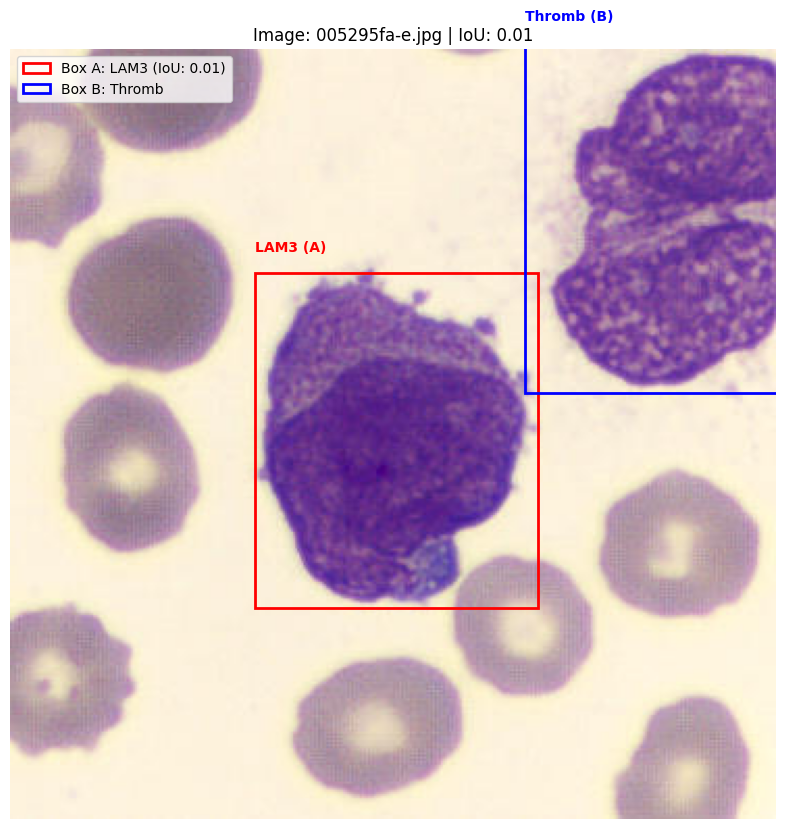

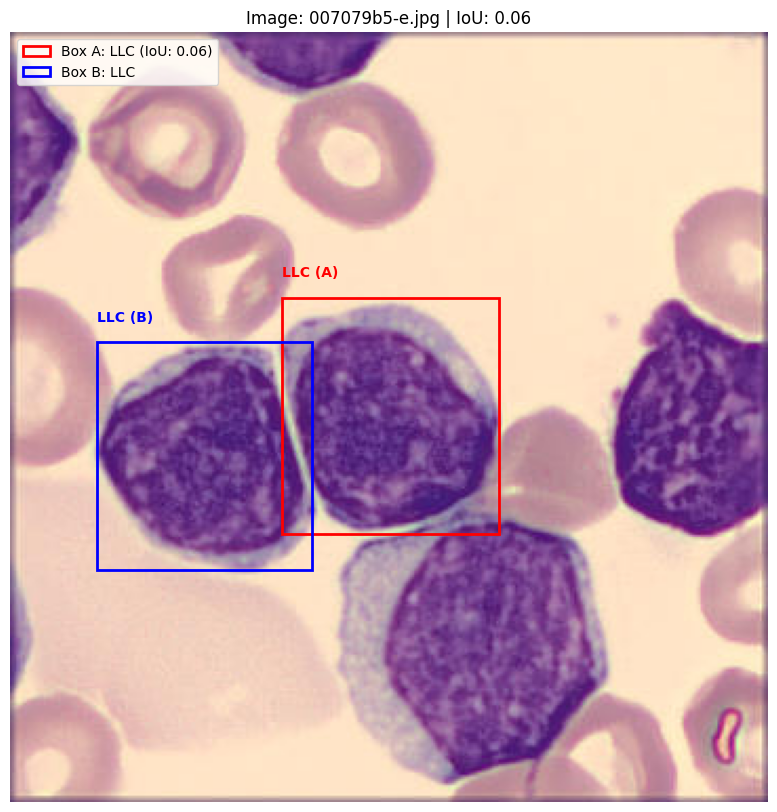

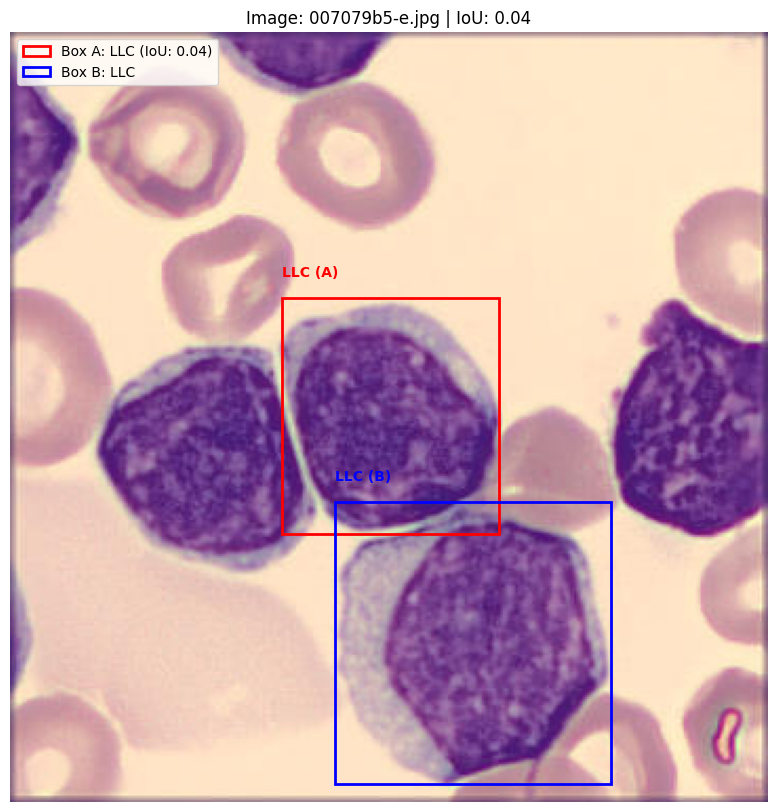

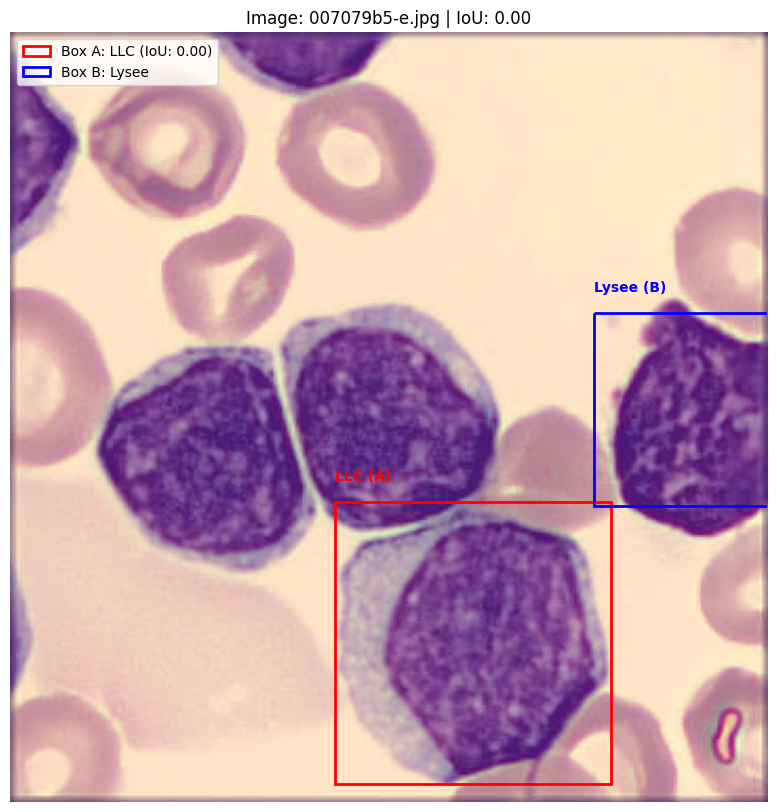

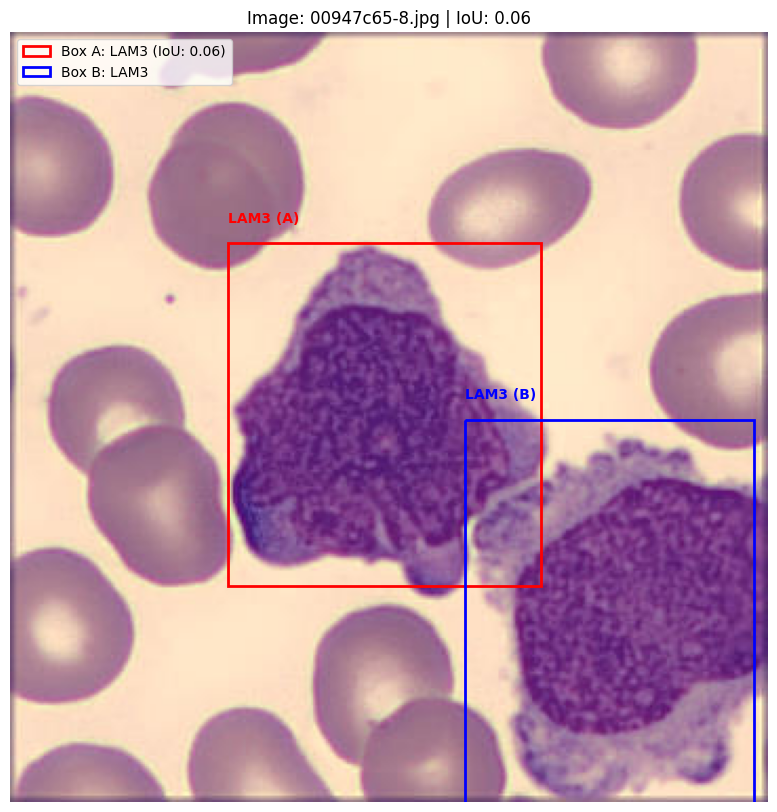

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image

import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image

def debug_visualization_from_overlaps(overlaps, df, images_path, num_samples=5):
    """
    Visualize overlapping bounding boxes using precomputed overlaps, including class labels.

    Parameters:
    - overlaps: List of precomputed overlaps (image_name, box_a_index, box_b_index, iou).
    - df: Original DataFrame containing bounding box data.
    - images_path: Path to the directory containing images.
    - num_samples: Number of overlaps to visualize.
    """
    if not overlaps:
        print("No overlapping boxes found.")
        return

    print(f"Total overlapping pairs: {len(overlaps)}")

    # Visualize up to num_samples overlaps
    for sample in overlaps[:num_samples]:
        image_name, idx_a, idx_b, iou = sample
        image_path = f"{images_path}/{image_name}"

        try:
            # Load the image
            image = Image.open(image_path)
        except FileNotFoundError:
            print(f"Image not found: {image_path}")
            continue

        # Retrieve the bounding boxes
        box_a = df.iloc[idx_a]
        box_b = df.iloc[idx_b]

        fig, ax = plt.subplots(1, figsize=(10, 10))
        ax.imshow(image)

        # Draw bounding box A
        rect_a = patches.Rectangle(
            (box_a['x1'], box_a['y1']),
            box_a['x2'] - box_a['x1'],
            box_a['y2'] - box_a['y1'],
            linewidth=2,
            edgecolor='red',
            facecolor='none',
            label=f"Box A: {box_a['class']} (IoU: {iou:.2f})"
        )
        ax.add_patch(rect_a)
        # Annotate class label for Box A
        ax.text(
            box_a['x1'], box_a['y1'] - 10,
            f"{box_a['class']} (A)",
            color='red', fontsize=10, fontweight='bold'
        )

        # Draw bounding box B
        rect_b = patches.Rectangle(
            (box_b['x1'], box_b['y1']),
            box_b['x2'] - box_b['x1'],
            box_b['y2'] - box_b['y1'],
            linewidth=2,
            edgecolor='blue',
            facecolor='none',
            label=f"Box B: {box_b['class']}"
        )
        ax.add_patch(rect_b)
        # Annotate class label for Box B
        ax.text(
            box_b['x1'], box_b['y1'] - 10,
            f"{box_b['class']} (B)",
            color='blue', fontsize=10, fontweight='bold'
        )

        # Add legend and title
        plt.legend(loc="upper left")
        plt.title(f"Image: {image_name} | IoU: {iou:.2f}")
        plt.axis('off')
        plt.show()



# Debug visualization
debug_visualization_from_overlaps(overlaps, df, images_path, num_samples=5)


#  Count the number of images with out-of-bound bounding boxes.

In [ ]:
from PIL import Image

def count_images_with_out_of_bound_boxes(df, images_path):
    """
    Count the number of images with out-of-bound bounding boxes.

    Parameters:
    - df: DataFrame containing bounding box data with columns ['NAME', 'x1', 'y1', 'x2', 'y2'].
    - images_path: Path to the directory containing images.

    Returns:
    - count: Number of images with out-of-bound bounding boxes.
    - out_of_bound_details: List of details for out-of-bound bounding boxes.
    """
    out_of_bound_images = set()
    out_of_bound_details = []

    for image_name, group in df.groupby('NAME'):
        image_path = f"{images_path}/{image_name}"
        try:
            # Load the image to get its dimensions
            with Image.open(image_path) as img:
                width, height = img.size
        except FileNotFoundError:
            print(f"Image not found: {image_path}")
            continue

        # Check bounding boxes for this image
        for _, row in group.iterrows():
            if (
                row['x1'] < 0 or row['y1'] < 0 or
                row['x2'] > width or row['y2'] > height
            ):
                # Add image to the out-of-bound set
                out_of_bound_images.add(image_name)
                # Store the details of the out-of-bound bounding box
                out_of_bound_details.append({
                    'Image': image_name,
                    'x1': row['x1'], 'y1': row['y1'],
                    'x2': row['x2'], 'y2': row['y2'],
                    'Width': width, 'Height': height
                })

    return len(out_of_bound_images), out_of_bound_details

# Count images with out-of-bound bounding boxes
num_out_of_bound_images, out_of_bound_details = count_images_with_out_of_bound_boxes(df, images_path)

print(f"Number of images with out-of-bound bounding boxes: {num_out_of_bound_images}")

# Display a sample of out-of-bound bounding boxes
if out_of_bound_details:
    print("\nSample out-of-bound bounding boxes:")
    for detail in out_of_bound_details[:5]:  # Show the first 5 for brevity
        print(detail)


Number of images with out-of-bound bounding boxes: 668

Sample out-of-bound bounding boxes:
{'Image': '005295fa-e.jpg', 'x1': 247, 'y1': -4, 'x2': 373, 'y2': 165, 'Width': 368, 'Height': 370}
{'Image': '007079b5-e.jpg', 'x1': 277, 'y1': 133, 'x2': 367, 'y2': 225, 'Width': 360, 'Height': 366}
{'Image': '00947c65-8.jpg', 'x1': 216, 'y1': 184, 'x2': 353, 'y2': 375, 'Width': 360, 'Height': 366}
{'Image': '00a10b20-b.jpg', 'x1': 36, 'y1': 275, 'x2': 176, 'y2': 408, 'Width': 360, 'Height': 366}
{'Image': '00eb7104-0.jpg', 'x1': -13, 'y1': 268, 'x2': 89, 'y2': 374, 'Width': 368, 'Height': 369}


### Adjust these images

In [ ]:
def adjust_bounding_boxes(df, images_path):
    """
    Adjust bounding box coordinates to ensure they are within the image borders.

    Parameters:
    - df: DataFrame containing bounding box data with columns ['NAME', 'x1', 'y1', 'x2', 'y2'].
    - images_path: Path to the directory containing images.

    Returns:
    - adjusted_df: DataFrame with adjusted bounding boxes and a 'fixed_border' column.
    - adjusted_details: List of details for bounding boxes that were adjusted.
    """
    adjusted_details = []

    # Make a copy of the DataFrame to avoid modifying the original
    adjusted_df = df.copy()

    # Add 'fixed_border' column
    adjusted_df['fixed_border'] = False

    for image_name, group in df.groupby('NAME'):
        image_path = f"{images_path}/{image_name}"
        try:
            # Load the image to get its dimensions
            with Image.open(image_path) as img:
                width, height = img.size
        except FileNotFoundError:
            print(f"Image not found: {image_path}")
            continue

        # Adjust bounding boxes for this image
        for idx, row in group.iterrows():
            original_box = row[['x1', 'y1', 'x2', 'y2']].to_dict()
            adjusted_box = {
                'x1': max(0, min(row['x1'], width)),
                'y1': max(0, min(row['y1'], height)),
                'x2': max(0, min(row['x2'], width)),
                'y2': max(0, min(row['y2'], height))
            }

            # Check if the box was adjusted
            if original_box != adjusted_box:
                adjusted_details.append({
                    'Image': image_name,
                    'Original_Box': original_box,
                    'Adjusted_Box': adjusted_box
                })
                # Update the DataFrame with adjusted coordinates
                adjusted_df.at[idx, 'x1'] = adjusted_box['x1']
                adjusted_df.at[idx, 'y1'] = adjusted_box['y1']
                adjusted_df.at[idx, 'x2'] = adjusted_box['x2']
                adjusted_df.at[idx, 'y2'] = adjusted_box['y2']

                # Mark as fixed
                adjusted_df.at[idx, 'fixed_border'] = True

    return adjusted_df, adjusted_details


# Fix bounding boxes
adjusted_df, adjusted_details = adjust_bounding_boxes(df, images_path)

#Save the adjusted DataFrame for future reference
adjusted_df.to_csv('adjusted_bounding_boxes.csv', index=False)

print(f"Number of bounding boxes adjusted: {len(adjusted_details)}")
if adjusted_details:
    print("\nSample adjusted bounding boxes:")
    for detail in adjusted_details[:5]:
        print(detail)


Number of bounding boxes adjusted: 722

Sample adjusted bounding boxes:
{'Image': '005295fa-e.jpg', 'Original_Box': {'x1': 247, 'y1': -4, 'x2': 373, 'y2': 165}, 'Adjusted_Box': {'x1': 247, 'y1': 0, 'x2': 368, 'y2': 165}}
{'Image': '007079b5-e.jpg', 'Original_Box': {'x1': 277, 'y1': 133, 'x2': 367, 'y2': 225}, 'Adjusted_Box': {'x1': 277, 'y1': 133, 'x2': 360, 'y2': 225}}
{'Image': '00947c65-8.jpg', 'Original_Box': {'x1': 216, 'y1': 184, 'x2': 353, 'y2': 375}, 'Adjusted_Box': {'x1': 216, 'y1': 184, 'x2': 353, 'y2': 366}}
{'Image': '00a10b20-b.jpg', 'Original_Box': {'x1': 36, 'y1': 275, 'x2': 176, 'y2': 408}, 'Adjusted_Box': {'x1': 36, 'y1': 275, 'x2': 176, 'y2': 366}}
{'Image': '00eb7104-0.jpg', 'Original_Box': {'x1': -13, 'y1': 268, 'x2': 89, 'y2': 374}, 'Adjusted_Box': {'x1': 0, 'y1': 268, 'x2': 89, 'y2': 369}}


In [ ]:
# Recheck for out-of-bound bounding boxes in the adjusted DataFrame
num_out_of_bound_images, out_of_bound_details = count_images_with_out_of_bound_boxes(adjusted_df, images_path)

print(f"Number of images with out-of-bound bounding boxes (after adjustment): {num_out_of_bound_images}")

# Display a sample of out-of-bound bounding boxes (if any, which shouldn't be the case)
if out_of_bound_details:
    print("\nSample out-of-bound bounding boxes (after adjustment):")
    for detail in out_of_bound_details[:5]:  # Show the first 5 for brevity
        print(detail)
else:
    print("No out-of-bound bounding boxes found in the adjusted dataset.")


Number of images with out-of-bound bounding boxes (after adjustment): 0
No out-of-bound bounding boxes found in the adjusted dataset.


 # identify cases where bounding boxes are overlapping or very near each other (indicating potential duplicate detections or closely located objects),

In [ ]:
from itertools import combinations

In [ ]:
# Import required module
from itertools import combinations

# Ensure the necessary columns are present
required_columns = {'NAME', 'class', 'x1', 'y1', 'x2', 'y2'}
if not required_columns.issubset(adjusted_df.columns):
    raise ValueError(f"DataFrame must contain the following columns: {required_columns}")

# Function to calculate Intersection over Union (IoU) between two boxes
def calculate_iou(box1, box2):
    x1_min, y1_min, x1_max, y1_max = box1
    x2_min, y2_min, x2_max, y2_max = box2

    inter_min_x = max(x1_min, x2_min)
    inter_min_y = max(y1_min, y2_min)
    inter_max_x = min(x1_max, x2_max)
    inter_max_y = min(y1_max, y2_max)

    inter_width = max(0, inter_max_x - inter_min_x)
    inter_height = max(0, inter_max_y - inter_min_y)
    inter_area = inter_width * inter_height

    area_box1 = (x1_max - x1_min) * (y1_max - y1_min)
    area_box2 = (x2_max - x2_min) * (y2_max - y2_min)

    union_area = area_box1 + area_box2 - inter_area
    return inter_area / union_area if union_area > 0 else 0

# Function to calculate the minimum distance between two boxes
def calculate_min_distance(box1, box2):
    x1_min, y1_min, x1_max, y1_max = box1
    x2_min, y2_min, x2_max, y2_max = box2

    if (x1_max >= x2_min and x2_max >= x1_min and
        y1_max >= y2_min and y2_max >= y1_min):
        return 0

    dx = max(x2_min - x1_max, x1_min - x2_max, 0)
    dy = max(y2_min - y1_max, y1_min - y2_max, 0)

    return (dx**2 + dy**2) ** 0.5

# Parameters for proximity
IOU_THRESHOLD = 0.3
DISTANCE_THRESHOLD = 50

# Lists to store overlapping and nearby bounding boxes
overlaps_same_class = []
overlaps_diff_class = []
proximities_same_class = []
proximities_diff_class = []

# Iterate through each image
for image_name, group in adjusted_df.groupby('NAME'):
    boxes = group[['x1', 'y1', 'x2', 'y2']].values
    classes = group['class'].values
    indices = group.index.tolist()

    # Iterate through all unique pairs of boxes in the image
    for (i, box1, class1), (j, box2, class2) in combinations(zip(indices, boxes, classes), 2):
        iou = calculate_iou(box1, box2)
        distance = calculate_min_distance(box1, box2)

        same_class = class1 == class2

        if iou > IOU_THRESHOLD:
            if same_class:
                overlaps_same_class.append({
                    'Image': image_name,
                    'Box1_Index': i,
                    'Box2_Index': j,
                    'Class': class1,
                    'IoU': iou
                })
            else:
                overlaps_diff_class.append({
                    'Image': image_name,
                    'Box1_Index': i,
                    'Box2_Index': j,
                    'Class1': class1,
                    'Class2': class2,
                    'IoU': iou
                })
        elif distance < DISTANCE_THRESHOLD:
            if same_class:
                proximities_same_class.append({
                    'Image': image_name,
                    'Box1_Index': i,
                    'Box2_Index': j,
                    'Class': class1,
                    'Distance': distance
                })
            else:
                proximities_diff_class.append({
                    'Image': image_name,
                    'Box1_Index': i,
                    'Box2_Index': j,
                    'Class1': class1,
                    'Class2': class2,
                    'Distance': distance
                })

# Convert lists to DataFrames for better visualization
df_overlaps_same = pd.DataFrame(overlaps_same_class)
df_overlaps_diff = pd.DataFrame(overlaps_diff_class)
df_proximities_same = pd.DataFrame(proximities_same_class)
df_proximities_diff = pd.DataFrame(proximities_diff_class)

# Display the results
print(f"Total overlapping bounding boxes (Same Class): {len(df_overlaps_same)}")
print(f"Total overlapping bounding boxes (Different Classes): {len(df_overlaps_diff)}")
print(f"Total nearby bounding boxes (Same Class): {len(df_proximities_same)}")
print(f"Total nearby bounding boxes (Different Classes): {len(df_proximities_diff)}")


Total overlapping bounding boxes (Same Class): 11
Total overlapping bounding boxes (Different Classes): 5
Total nearby bounding boxes (Same Class): 3548
Total nearby bounding boxes (Different Classes): 1229


In [ ]:
from PIL import Image, ImageDraw

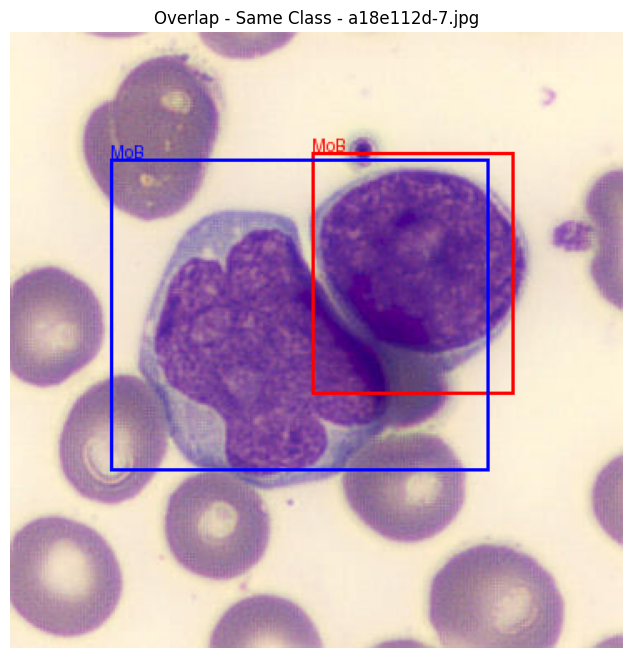

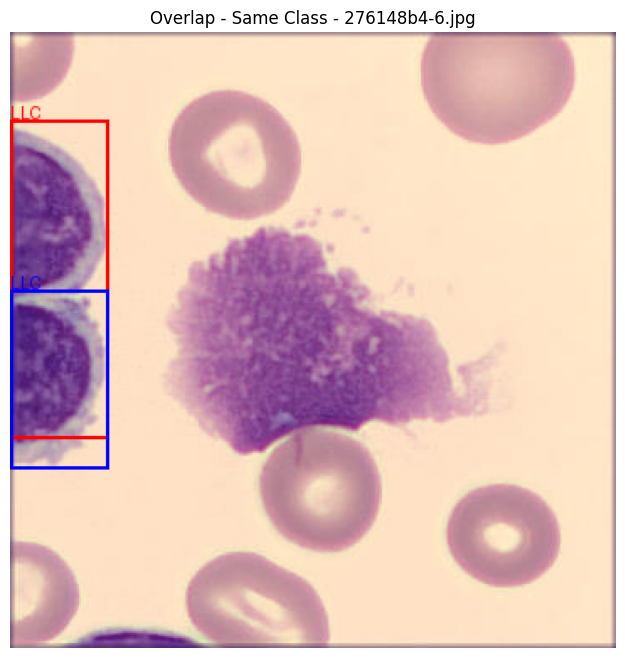

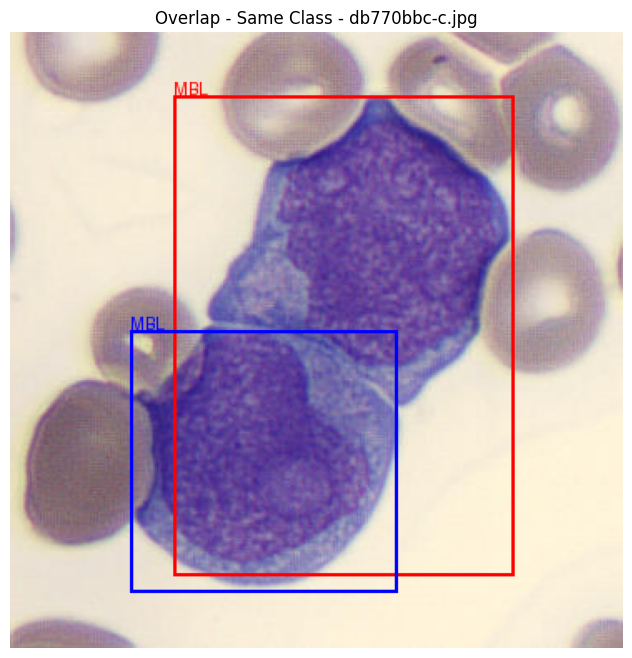

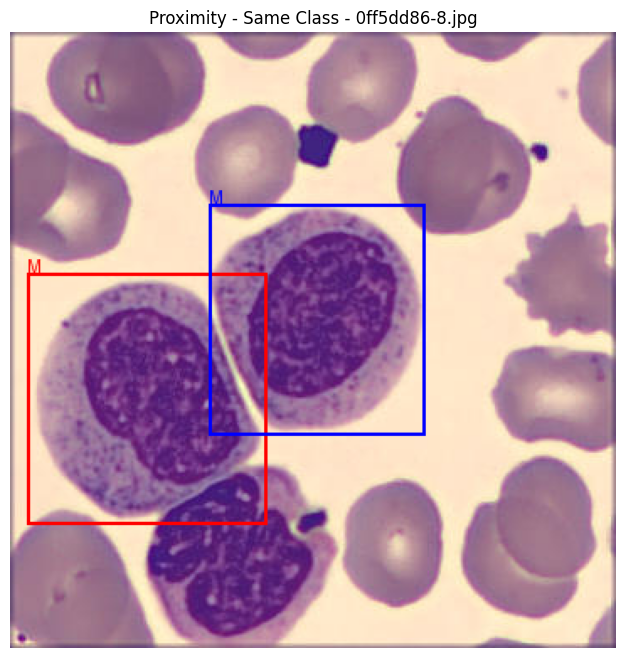

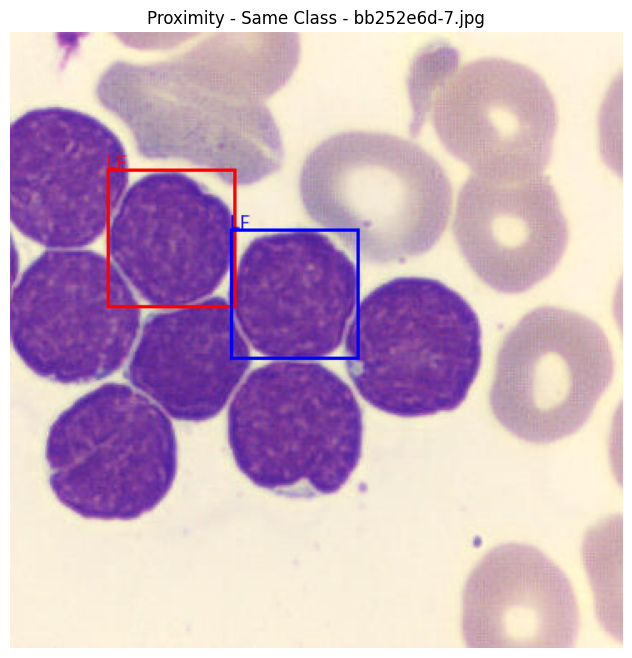

...

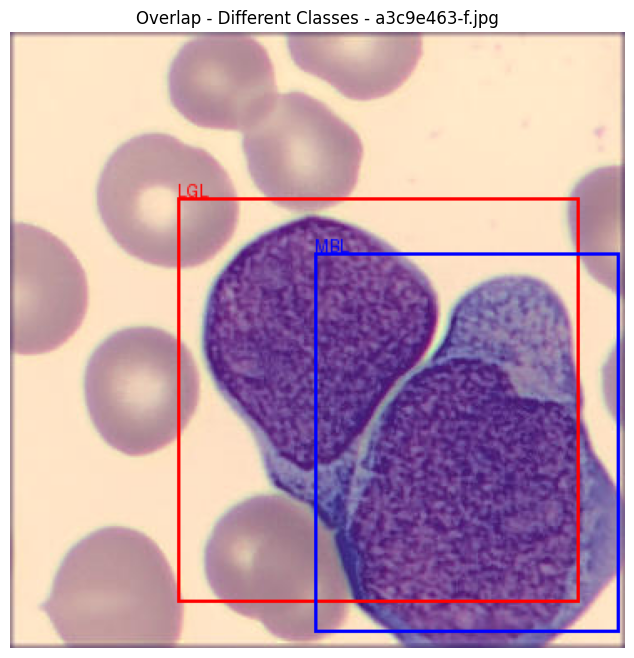

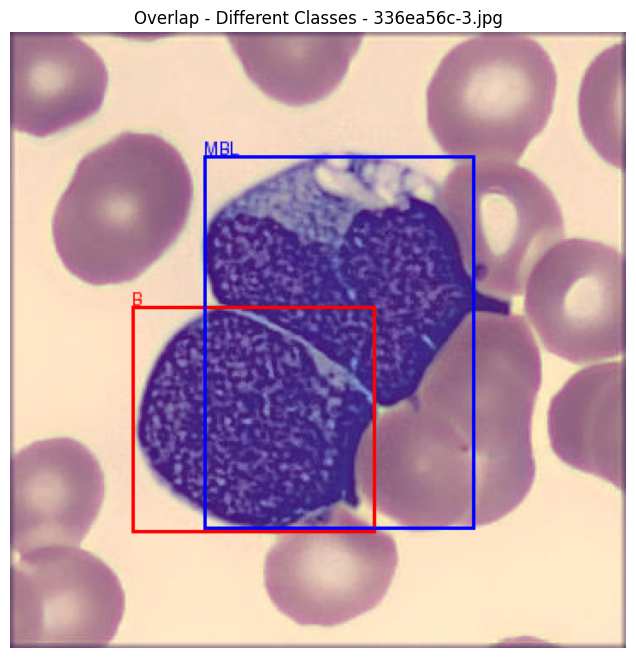

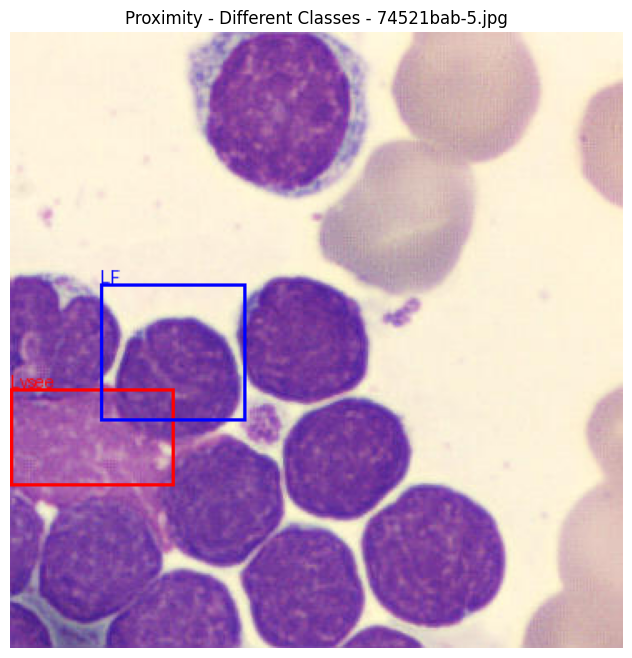

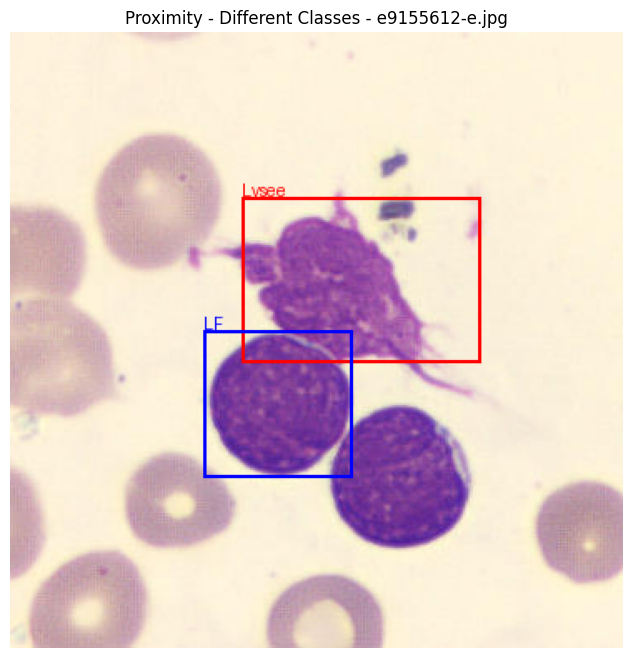

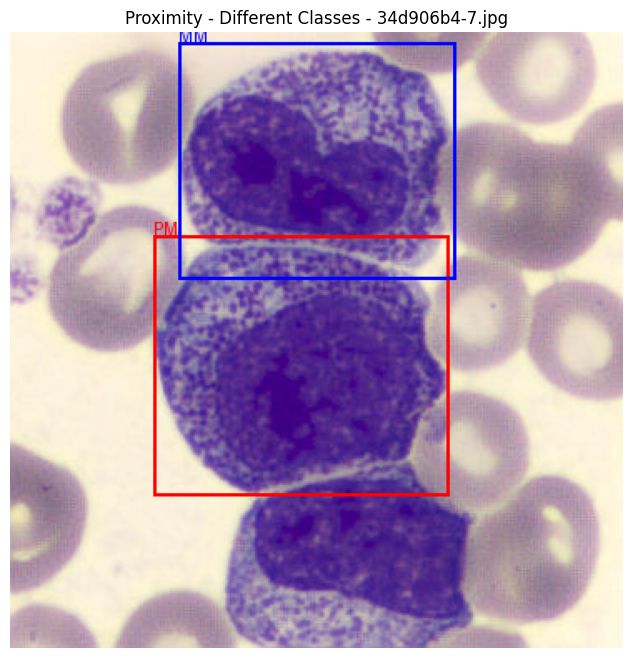

In [ ]:
# Visualization function with class display
def visualize_cases(df, case_type, adjusted_df, images_path, sample_size=3):
    if df.empty:
        print(f"No {case_type} cases to display.")
        return

    sample_cases = df.sample(n=min(sample_size, len(df)), random_state=42)

    for _, row in sample_cases.iterrows():
        image_name = row['Image']
        image_path = os.path.join(images_path, image_name)

        try:
            with Image.open(image_path) as img:
                draw = ImageDraw.Draw(img)

                # Fetch first bounding box coordinates and class
                box1_row = adjusted_df.loc[row['Box1_Index']]
                box1 = [box1_row['x1'], box1_row['y1'], box1_row['x2'], box1_row['y2']]
                class1 = box1_row['class']

                # Fetch second bounding box coordinates and class
                box2_row = adjusted_df.loc[row['Box2_Index']]
                box2 = [box2_row['x1'], box2_row['y1'], box2_row['x2'], box2_row['y2']]
                class2 = box2_row['class']

                # Draw the bounding boxes
                draw.rectangle(box1, outline="red", width=2)
                draw.rectangle(box2, outline="blue", width=2)

                # Annotate the class labels
                draw.text((box1[0], box1[1] - 10), str(class1), fill="red")
                draw.text((box2[0], box2[1] - 10), str(class2), fill="blue")

                # Display the image with bounding boxes
                plt.figure(figsize=(8, 8))
                plt.imshow(img)
                plt.title(f"{case_type} - {image_name}")
                plt.axis('off')
                plt.show()
        except FileNotFoundError:
            print(f"Image not found: {image_path}")
        except KeyError as e:
            print(f"KeyError: {e} for image {image_name}")

# Visualize some same class overlaps and proximities
visualize_cases(df_overlaps_same, "Overlap - Same Class", adjusted_df, images_path)
visualize_cases(df_proximities_same, "Proximity - Same Class", adjusted_df, images_path)

# Visualize some different class overlaps and proximities
visualize_cases(df_overlaps_diff, "Overlap - Different Classes", adjusted_df, images_path)
visualize_cases(df_proximities_diff, "Proximity - Different Classes", adjusted_df, images_path)


In [ ]:
# Import required modules
import pandas as pd

# Ensure the necessary columns are present
required_columns = {'NAME', 'class', 'x1', 'y1', 'x2', 'y2'}
if not required_columns.issubset(adjusted_df.columns):
    raise ValueError(f"DataFrame must contain the following columns: {required_columns}")

# Function to calculate Intersection over Union (IoU) between two boxes
def calculate_iou(box1, box2):
    x1_min, y1_min, x1_max, y1_max = box1
    x2_min, y2_min, x2_max, y2_max = box2

    inter_min_x = max(x1_min, x2_min)
    inter_min_y = max(y1_min, y2_min)
    inter_max_x = min(x1_max, x2_max)
    inter_max_y = min(y1_max, y2_max)

    inter_width = max(0, inter_max_x - inter_min_x)
    inter_height = max(0, inter_max_y - inter_min_y)
    inter_area = inter_width * inter_height

    area_box1 = (x1_max - x1_min) * (y1_max - y1_min)
    area_box2 = (x2_max - x2_min) * (y2_max - y2_min)

    union_area = area_box1 + area_box2 - inter_area
    return inter_area / union_area if union_area > 0 else 0

# Parameters for proximity
IOU_THRESHOLD = 0.3
DISTANCE_THRESHOLD = 50

# Store indices of rows to drop
indices_to_drop = set()

# Iterate through each image
for image_name, group in adjusted_df.groupby('NAME'):
    boxes = group[['x1', 'y1', 'x2', 'y2']].values
    classes = group['class'].values
    indices = group.index.tolist()

    # Iterate through all unique pairs of boxes in the image
    for (i, box1, class1), (j, box2, class2) in combinations(zip(indices, boxes, classes), 2):
        iou = calculate_iou(box1, box2)
        if iou > IOU_THRESHOLD:
            if class1 == class2:
                area_box1 = (box1[2] - box1[0]) * (box1[3] - box1[1])
                area_box2 = (box2[2] - box2[0]) * (box2[3] - box2[1])
                if area_box1 > area_box2:
                    indices_to_drop.add(j)
                else:
                    indices_to_drop.add(i)
            else:
                indices_to_drop.update(group.index)

# Drop the indices from the DataFrame
adjusted_df.drop(indices_to_drop, inplace=True)

# Save the cleaned DataFrame
adjusted_df.to_csv("cleaned_data.csv", index=False)

# Display information about removed data
print(f"Total bounding boxes removed: {len(indices_to_drop)}")

Total bounding boxes removed: 25


In [ ]:
adjusted_df = pd.read_csv('cleaned_data.csv')

In [ ]:
# Reinitialize lists to store overlaps and proximities
overlaps_same_class = []
overlaps_diff_class = []
proximities_same_class = []
proximities_diff_class = []

# Iterate through each image in the cleaned DataFrame
for image_name, group in adjusted_df.groupby('NAME'):
    boxes = group[['x1', 'y1', 'x2', 'y2']].values
    classes = group['class'].values
    indices = group.index.tolist()

    # Iterate through all unique pairs of boxes in the image
    for (i, box1, class1), (j, box2, class2) in combinations(zip(indices, boxes, classes), 2):
        iou = calculate_iou(box1, box2)
        distance = calculate_min_distance(box1, box2)

        same_class = class1 == class2

        if iou > IOU_THRESHOLD:
            if same_class:
                overlaps_same_class.append({
                    'Image': image_name,
                    'Box1_Index': i,
                    'Box2_Index': j,
                    'Class': class1,
                    'IoU': iou
                })
            else:
                overlaps_diff_class.append({
                    'Image': image_name,
                    'Box1_Index': i,
                    'Box2_Index': j,
                    'Class1': class1,
                    'Class2': class2,
                    'IoU': iou
                })
        elif distance < DISTANCE_THRESHOLD:
            if same_class:
                proximities_same_class.append({
                    'Image': image_name,
                    'Box1_Index': i,
                    'Box2_Index': j,
                    'Class': class1,
                    'Distance': distance
                })
            else:
                proximities_diff_class.append({
                    'Image': image_name,
                    'Box1_Index': i,
                    'Box2_Index': j,
                    'Class1': class1,
                    'Class2': class2,
                    'Distance': distance
                })

# Convert lists to DataFrames for better visualization
df_overlaps_same_cleaned = pd.DataFrame(overlaps_same_class)
df_overlaps_diff_cleaned = pd.DataFrame(overlaps_diff_class)
df_proximities_same_cleaned = pd.DataFrame(proximities_same_class)
df_proximities_diff_cleaned = pd.DataFrame(proximities_diff_class)

# Display the updated results
print("\nAfter Dropping:")
print(f"Total overlapping bounding boxes (Same Class): {len(df_overlaps_same_cleaned)}")
print(f"Total overlapping bounding boxes (Different Classes): {len(df_overlaps_diff_cleaned)}")
print(f"Total nearby bounding boxes (Same Class): {len(df_proximities_same_cleaned)}")
print(f"Total nearby bounding boxes (Different Classes): {len(df_proximities_diff_cleaned)}")



After Dropping:
Total overlapping bounding boxes (Same Class): 0
Total overlapping bounding boxes (Different Classes): 0
Total nearby bounding boxes (Same Class): 3539
Total nearby bounding boxes (Different Classes): 1224


In [ ]:
adjusted_df.shape

(52723, 7)

# Data Balancing

In [ ]:
import pandas as pd

# Function to downsample data to approximately 600 rows per class, considering all bounding boxes per image
def downsample_to_approx_rows_per_class(df, target_rows, class_column='class', image_id_column='NAME'):
    def downsample_group(group):
        unique_images = group[image_id_column].unique()
        sampled_group = pd.DataFrame()  # Initialize empty DataFrame to hold sampled data
        np.random.shuffle(unique_images)  # Randomize the order of images

        for image_id in unique_images:
            image_rows = group[group[image_id_column] == image_id]  # Get all rows for the current image
            if len(sampled_group) + len(image_rows) <= target_rows:
                sampled_group = pd.concat([sampled_group, image_rows])  # Add rows to the sampled group
            else:
                break  # Stop adding if the target number of rows would be exceeded

        return sampled_group

    # Group by class and apply the sampling function to each group
    return df.groupby(class_column).apply(downsample_group).reset_index(drop=True)

# Assuming adjusted_df has columns 'class' and 'image_id'
sampled_df = downsample_to_approx_rows_per_class(adjusted_df, 600, 'class', 'NAME')

# Checking the sampled data
sampled_counts = sampled_df.groupby('class').size()
print(f"Sampled data count per class:\n{sampled_counts}")

# Saving the sampled DataFrame to a CSV file
sampled_df.to_csv('downsampled_data.csv', index=False)
print("Downsampled DataFrame has been saved to 'downsampled_data.csv'.")

Sampled data count per class:
class
B           600
BA          600
EO          600
Er          600
LAM3        600
LF          600
LGL         600
LH_lyAct    600
LLC         598
LM          600
LY          600
LZMG        600
LyB         600
Lysee       600
M           600
MBL         600
MM          600
MO          600
MoB         599
PM          600
PNN         600
SS          600
Thromb      600
dtype: int64
Downsampled DataFrame has been saved to 'downsampled_data.csv'.


<ipython-input-32-bc97e34a2fd3>:20: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  return df.groupby(class_column).apply(downsample_group).reset_index(drop=True)


In [ ]:
# Reinitialize lists to store overlaps and proximities
overlaps_same_class = []
overlaps_diff_class = []
proximities_same_class = []
proximities_diff_class = []

# Iterate through each image in the cleaned DataFrame
for image_name, group in sampled_df.groupby('NAME'):
    boxes = group[['x1', 'y1', 'x2', 'y2']].values
    classes = group['class'].values
    indices = group.index.tolist()

    # Iterate through all unique pairs of boxes in the image
    for (i, box1, class1), (j, box2, class2) in combinations(zip(indices, boxes, classes), 2):
        iou = calculate_iou(box1, box2)
        distance = calculate_min_distance(box1, box2)

        same_class = class1 == class2

        if iou > IOU_THRESHOLD:
            if same_class:
                overlaps_same_class.append({
                    'Image': image_name,
                    'Box1_Index': i,
                    'Box2_Index': j,
                    'Class': class1,
                    'IoU': iou
                })
            else:
                overlaps_diff_class.append({
                    'Image': image_name,
                    'Box1_Index': i,
                    'Box2_Index': j,
                    'Class1': class1,
                    'Class2': class2,
                    'IoU': iou
                })
        elif distance < DISTANCE_THRESHOLD:
            if same_class:
                proximities_same_class.append({
                    'Image': image_name,
                    'Box1_Index': i,
                    'Box2_Index': j,
                    'Class': class1,
                    'Distance': distance
                })
            else:
                proximities_diff_class.append({
                    'Image': image_name,
                    'Box1_Index': i,
                    'Box2_Index': j,
                    'Class1': class1,
                    'Class2': class2,
                    'Distance': distance
                })

# Convert lists to DataFrames for better visualization
df_overlaps_same_cleaned = pd.DataFrame(overlaps_same_class)
df_overlaps_diff_cleaned = pd.DataFrame(overlaps_diff_class)
df_proximities_same_cleaned = pd.DataFrame(proximities_same_class)
df_proximities_diff_cleaned = pd.DataFrame(proximities_diff_class)

# Display the updated results
print("\nAfter Dropping:")
print(f"Total overlapping bounding boxes (Same Class): {len(df_overlaps_same_cleaned)}")
print(f"Total overlapping bounding boxes (Different Classes): {len(df_overlaps_diff_cleaned)}")
print(f"Total nearby bounding boxes (Same Class): {len(df_proximities_same_cleaned)}")
print(f"Total nearby bounding boxes (Different Classes): {len(df_proximities_diff_cleaned)}")



After Dropping:
Total overlapping bounding boxes (Same Class): 0
Total overlapping bounding boxes (Different Classes): 0
Total nearby bounding boxes (Same Class): 932
Total nearby bounding boxes (Different Classes): 77


In [ ]:
import pandas as pd
import shutil
import os

# Set the path to the CSV file and the current directory containing the images
csv_file_path = '/content/downsampled_data.csv'
current_image_directory = '/content/Images/dataset_cytologia'
new_directory_path = '/content/downsampled_images'

# Create a new directory if it doesn't exist
if not os.path.exists(new_directory_path):
    os.makedirs(new_directory_path)

# Read the CSV file
df = pd.read_csv(csv_file_path)

# Loop through the image names in the CSV file
for image_name in df['NAME']:
    source_path = os.path.join(current_image_directory, image_name)
    destination_path = os.path.join(new_directory_path, image_name)

    # Check if the image exists in the current directory
    if os.path.exists(source_path):
        # Copy the image to the new directory
        shutil.copy(source_path, destination_path)
    else:
        print(f"Image not found: {image_name}")


In [ ]:
import os

# Set the path to the directory where the images are stored
directory_path = '/content/downsampled_images'

# Count the number of files in the directory
file_count = len([name for name in os.listdir(directory_path) if os.path.isfile(os.path.join(directory_path, name))])

print(f"Total number of image files in the directory: {file_count}")

Total number of image files in the directory: 12875


**Analyze size distrubution in images**

In [ ]:
from collections import Counter
from PIL import Image
import matplotlib.pyplot as plt

# Dictionary to store resolutions
resolution_counter = Counter()

# Iterate through each image in the DataFrame
for image_name in sampled_df['NAME'].unique():
    image_path = os.path.join(images_path, image_name)
    try:
        with Image.open(image_path) as img:
            resolution = f"{img.width}x{img.height}"
            resolution_counter[resolution] += 1
    except FileNotFoundError:
        print(f"Image not found: {image_path}")

# Convert resolution counter to a sorted DataFrame for better visualization
resolution_df = (
    pd.DataFrame.from_dict(resolution_counter, orient="index", columns=["Frequency"])
    .reset_index()
    .rename(columns={"index": "Resolution"})
    .sort_values(by="Frequency", ascending=False)
)


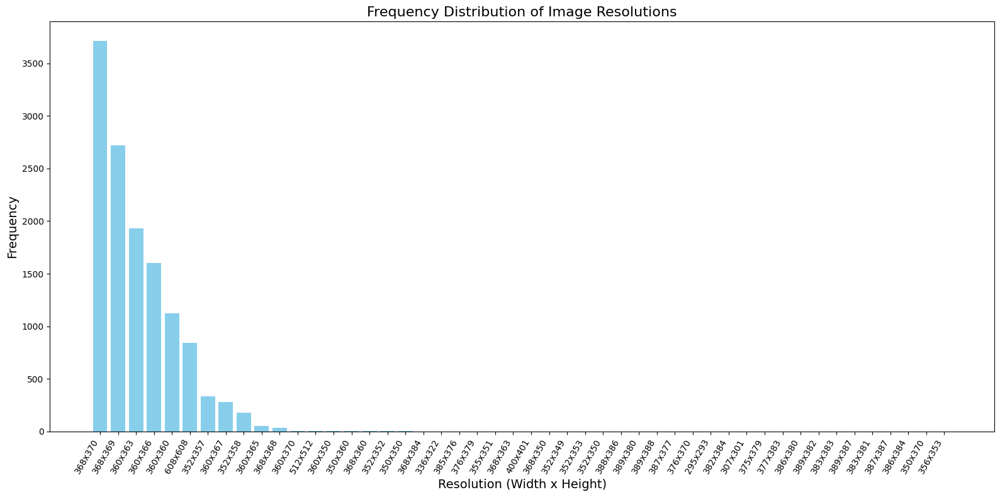

In [ ]:
# Plot the frequency distribution of resolutions
plt.figure(figsize=(16, 8))
plt.bar(resolution_df['Resolution'], resolution_df['Frequency'], color='skyblue')
plt.title("Frequency Distribution of Image Resolutions", fontsize=16)
plt.xlabel("Resolution (Width x Height)", fontsize=14)
plt.ylabel("Frequency", fontsize=14)
plt.xticks(rotation=60, ha="right", fontsize=10)
plt.tight_layout()

plt.show()


In [ ]:
import os
import shutil

transformed_images_path = '/content/Images/Adjusted_size'
if os.path.exists(transformed_images_path):
    shutil.rmtree(transformed_images_path)
print("Old resized-images folder deleted.")

Old resized-images folder deleted.


# RESIZE

In [ ]:
import os
from PIL import Image
import pandas as pd
import matplotlib.pyplot as plt

# Define the target resolution
TARGET_WIDTH = 352
TARGET_HEIGHT = 357

# Path to your images directory
images_path = '/content/downsampled_images'
os.makedirs(transformed_images_path, exist_ok=True)

# 1) Drop exact duplicates of bounding boxes if they exist
sampled_df.drop_duplicates(subset=['NAME','x1','y1','x2','y2'], inplace=True)

def resize_and_adjust_boxes(row):
    image_name = row['NAME']
    boxes = row[['x1', 'y1', 'x2', 'y2']].copy()  # Make a copy to avoid warning
    image_path = os.path.join(images_path, image_name)
    transformed_image_path = os.path.join(transformed_images_path, image_name)

    try:
        with Image.open(image_path) as img:
            orig_width, orig_height = img.width, img.height

            # Calculate scaling factors
            scale_x = TARGET_WIDTH / orig_width
            scale_y = TARGET_HEIGHT / orig_height

            # Resize and save the image
            img_resized = img.resize((TARGET_WIDTH, TARGET_HEIGHT), resample=Image.Resampling.LANCZOS)
            img_resized.save(transformed_image_path)

            # Adjust bounding boxes
            boxes['x1'] = int(boxes['x1'] * scale_x)
            boxes['y1'] = int(boxes['y1'] * scale_y)
            boxes['x2'] = int(boxes['x2'] * scale_x)
            boxes['y2'] = int(boxes['y2'] * scale_y)

            # Overwrite the original row columns so we only have one set
            row[['x1','y1','x2','y2']] = boxes

            row['status'] = True
            return row
    except Exception as e:
        print(f"Error processing {image_name}: {e}")
        row['status'] = False
        return row

# Apply the resizing and bounding box adjustment
final_df = sampled_df.apply(resize_and_adjust_boxes, axis=1)

# Filter for successfully transformed images
transformed_df = final_df[final_df['status'] == True].copy()

# Save the transformed bounding box data
transformed_df.drop(columns=['status'], inplace=True)
transformed_df.to_csv('/content/drive/MyDrive/Hematology_data/Final_data_preprocessed/transformed_bounding_boxes.csv', index=False)

print("Transformed images saved and bounding boxes adjusted.")

Transformed images saved and bounding boxes adjusted.


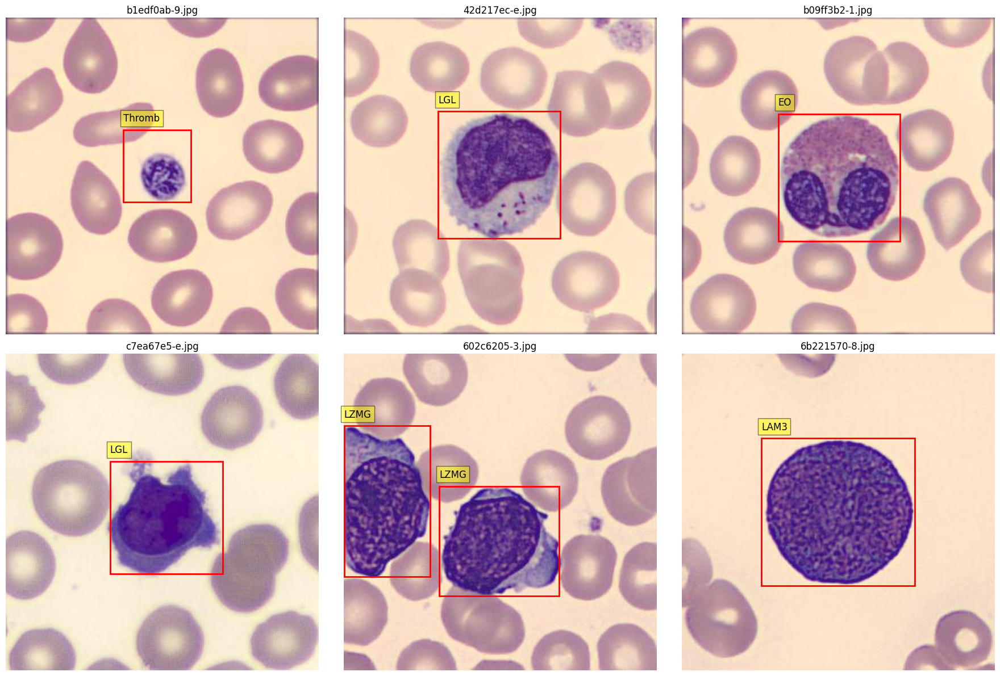

In [ ]:
import random

# Function to visualize images with bounding boxes and labels
def visualize_samples(df, images_dir, num_samples=6):
    # Ensure there are enough unique images
    unique_images = df['NAME'].unique()
    if len(unique_images) < num_samples:
        print(f"Not enough unique images to display. Found only {len(unique_images)} images.")
        num_samples = len(unique_images)

    # Randomly select sample images
    sample_images = random.sample(list(unique_images), num_samples)

    # Set up the matplotlib figure
    fig, axes = plt.subplots(2, 3, figsize=(18, 12))
    axes = axes.flatten()

    for idx, image_name in enumerate(sample_images):
        ax = axes[idx]
        image_path = os.path.join(images_dir, image_name)

        try:
            with Image.open(image_path) as img:
                ax.imshow(img)
                ax.axis('off')  # Hide axes

                # Get all bounding boxes for this image
                image_boxes = df[df['NAME'] == image_name]

                for _, box in image_boxes.iterrows():
                    x1, y1, x2, y2 = box['x1'], box['y1'], box['x2'], box['y2']
                    label = box.get('class', 'N/A')

                    # Draw rectangle
                    rect = plt.Rectangle((x1, y1), x2 - x1, y2 - y1,
                                         linewidth=2, edgecolor='red', facecolor='none')
                    ax.add_patch(rect)

                    # Add label
                    ax.text(x1, y1 - 10, label,
                            bbox=dict(facecolor='yellow', alpha=0.5),
                            fontsize=12, color='black')

                ax.set_title(image_name)
        except Exception as e:
            print(f"Error loading image {image_name}: {e}")
            ax.axis('off')
            ax.set_title(f"Error loading {image_name}")

    # Hide any unused subplots
    for i in range(num_samples, len(axes)):
        axes[i].axis('off')

    plt.tight_layout()
    plt.show()

# Call the visualization function
visualize_samples(transformed_df, transformed_images_path, num_samples=6)

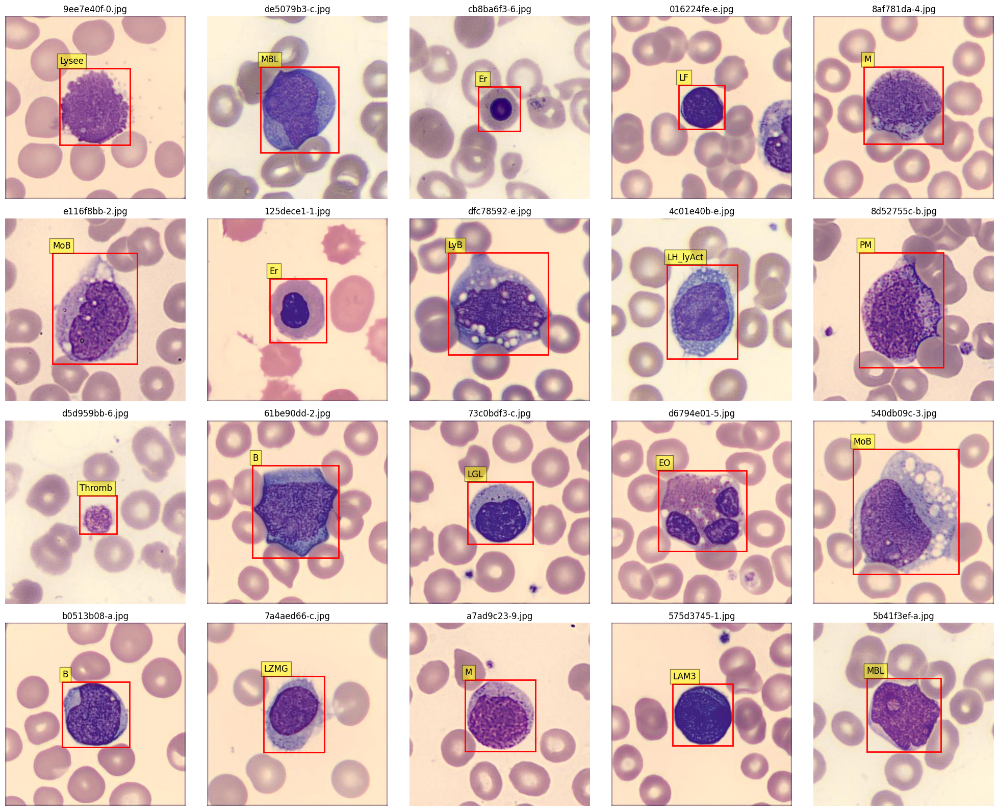

In [ ]:
def visualize_samples(df, images_dir, num_samples=20):
    # Ensure there are enough unique images
    unique_images = df['NAME'].unique()
    if len(unique_images) < num_samples:
        print(f"Not enough unique images to display. Found only {len(unique_images)} unique images.")
        num_samples = len(unique_images)
    if num_samples == 0:
        print("No images to display.")
        return

    # Randomly select sample images
    sample_images = random.sample(list(unique_images), num_samples)

    # Calculate rows and columns for subplot
    cols = 5  # You can adjust this number based on your preference
    rows = num_samples // cols + (num_samples % cols > 0)

    # Set up the matplotlib figure
    fig, axes = plt.subplots(rows, cols, figsize=(20, 4 * rows))
    axes = axes.flatten()

    for idx, image_name in enumerate(sample_images):
        ax = axes[idx]
        image_path = os.path.join(images_dir, image_name)

        try:
            with Image.open(image_path) as img:
                ax.imshow(img)
                ax.axis('off')  # Hide axes

                # Get all bounding boxes for this image
                image_boxes = df[df['NAME'] == image_name]

                for _, box in image_boxes.iterrows():
                    x1, y1, x2, y2 = box['x1'], box['y1'], box['x2'], box['y2']
                    label = box.get('class', 'N/A')  # Provide a default value

                    # Draw rectangle
                    rect = plt.Rectangle((x1, y1), x2 - x1, y2 - y1,
                                         linewidth=2, edgecolor='red', facecolor='none')
                    ax.add_patch(rect)

                    # Add label
                    ax.text(x1, y1 - 10, label,
                            bbox=dict(facecolor='yellow', alpha=0.5),
                            fontsize=12, color='black')

                ax.set_title(image_name)
        except Exception as e:
            print(f"Error loading image {image_name}: {e}")
            ax.axis('off')
            ax.set_title(f"Error loading {image_name}")

    # Hide any unused subplots
    for i in range(num_samples, len(axes)):
        axes[i].axis('off')

    plt.tight_layout()
    plt.show()

# Example usage, assuming 'transformed_df' and 'transformed_images_path' are defined
visualize_samples(transformed_df, transformed_images_path, num_samples=20)

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import shutil

# Define the source directory (in Colab) and the destination directory (in Google Drive)
source_directory = '/content/downsampled_images'
destination_directory = '/content/drive/MyDrive/Hematology_data/Final_data_preprocessed/downsampled_resized_images'

# Copy entire folder from Colab to Google Drive
shutil.copytree(source_directory, destination_directory)

'/content/drive/MyDrive/Hematology_data/Final_data_preprocessed/downsampled_resized_images'

In [ ]:
import zipfile
import os

def zip_folder(folder_path, output_path):
    # Create a ZipFile object
    with zipfile.ZipFile(output_path, 'w', zipfile.ZIP_DEFLATED) as zipf:
        # Walk through all the directories and files in the folder
        for root, dirs, files in os.walk(folder_path):
            for file in files:
                # Create the complete filepath by joining root and file
                file_path = os.path.join(root, file)
                zipf.write(file_path, arcname=os.path.relpath(file_path, os.path.join(folder_path, '..')))

# Example usage
folder_to_zip = '/content/drive/MyDrive/Hematology_data/downsampled_images'  # Set this to your images directory path
zip_output_name = '/content/drive/MyDrive/Hematology_data/Final_data_preprocessed/downsampled_zipped_images.zip'  # Set this to what you want the zip file to be named
zip_folder(folder_to_zip, zip_output_name)
print("Folder successfully zipped!")

Folder successfully zipped!


# COCO and training

In [ ]:
import os
import pandas as pd

# Class-to-ID mapping (ensure this matches your data.yaml)
class_mapping = {
    'PNN': 0, 'Lysee': 1, 'LAM3': 2, 'LLC': 3, 'LyB': 4, 'MO': 5, 'MBL': 6,
    'LGL': 7, 'EO': 8, 'Thromb': 9, 'Er': 10, 'B': 11, 'LF': 12, 'LY': 13,
    'M': 14, 'MM': 15, 'LH_lyAct': 16, 'MoB': 17, 'PM': 18, 'BA': 19, 'LM': 20,
    'LZMG': 21, 'SS': 22
}

# Path to your dataset CSV
csv_path = "/content/drive/MyDrive/Hematology_data/Final_data_preprocessed/transformed_bounding_boxes.csv"
data = pd.read_csv(csv_path)

# Replace class names with IDs
data = data.drop(columns=['fixed_border'])
data['class_id'] = data['class'].map(class_mapping)

# Save the updated CSV
updated_csv_path = "/content/drive/MyDrive/Hematology_data/Final_data_preprocessed/transformed_bounding_boxes_with_classid.csv"
data.to_csv(updated_csv_path, index=False)
print(f"Updated dataset saved to {updated_csv_path}")

Updated dataset saved to /content/drive/MyDrive/Hematology_data/Final_data_preprocessed/transformed_bounding_boxes_with_classid.csv


In [ ]:
import os
import shutil
import pandas as pd
import cv2
from sklearn.model_selection import train_test_split

# Define paths
csv_path = "/content/drive/MyDrive/Hematology_data/Final_data_preprocessed/transformed_bounding_boxes_with_classid.csv"  # Your CSV file containing annotations
image_dir = "/content/drive/MyDrive/Hematology_data/Final_data_preprocessed/downsampled_resized_images"                          # Directory containing images
output_dir = "/content/drive/MyDrive/Hematology_data/Final_data_preprocessed/yolo_annotations_format"                     # Directory to save the split data

# Load the CSV file
data = pd.read_csv(csv_path)

# Split the data into training and temp sets (90% train, 10% temp)
train_data, temp_data = train_test_split(data, test_size=0.1, stratify=data['class'], random_state=42)

# Further split the temp data into validation and test sets (50% each of the temp set)
val_data, test_data = train_test_split(temp_data, test_size=0.5, stratify=temp_data['class'], random_state=42)

# Create directories for YOLO format output
train_img_dir = os.path.join(output_dir, "train/images")
train_label_dir = os.path.join(output_dir, "train/labels")
val_img_dir = os.path.join(output_dir, "val/images")
val_label_dir = os.path.join(output_dir, "val/labels")
test_img_dir = os.path.join(output_dir, "test/images")
test_label_dir = os.path.join(output_dir, "test/labels")

os.makedirs(train_img_dir, exist_ok=True)
os.makedirs(train_label_dir, exist_ok=True)
os.makedirs(val_img_dir, exist_ok=True)
os.makedirs(val_label_dir, exist_ok=True)
os.makedirs(test_img_dir, exist_ok=True)
os.makedirs(test_label_dir, exist_ok=True)

# Function to convert bounding box to YOLO format
def convert_to_yolo_format(row, img_dir):
    img_path = os.path.join(img_dir, row['NAME'])
    img = cv2.imread(img_path)
    if img is None:
        print(f"Could not read image: {img_path}")
        return None
    img_height, img_width, _ = img.shape
    x_center = ((row['x1'] + row['x2']) / 2) / img_width
    y_center = ((row['y1'] + row['y2']) / 2) / img_height
    width = (row['x2'] - row['x1']) / img_width
    height = (row['y2'] - row['y1']) / img_height
    return f"{row['class_id']} {x_center:.6f} {y_center:.6f} {width:.6f} {height:.6f}"

# Function to save YOLO annotations
def save_yolo_annotations(data, img_dir, label_dir, image_src_dir):
    for img_name, group in data.groupby("NAME"):
        src_img_path = os.path.join(image_src_dir, img_name)
        dst_img_path = os.path.join(img_dir, img_name)
        if os.path.exists(src_img_path):
            shutil.copy(src_img_path, dst_img_path)
        label_path = os.path.join(label_dir, img_name.replace('.jpg', '.txt'))
        with open(label_path, 'w') as label_file:
            for _, row in group.iterrows():
                yolo_line = convert_to_yolo_format(row, image_src_dir)
                if yolo_line:
                    label_file.write(yolo_line + '\n')

# Save training data
save_yolo_annotations(train_data, train_img_dir, train_label_dir, image_dir)

# Save validation data
save_yolo_annotations(val_data, val_img_dir, val_label_dir, image_dir)

# Save test data
save_yolo_annotations(test_data, test_img_dir, test_label_dir, image_dir)

# Save the split CSVs (optional)
train_data.to_csv(os.path.join(output_dir, "train_annotations.csv"), index=False)
val_data.to_csv(os.path.join(output_dir, "val_annotations.csv"), index=False)
test_data.to_csv(os.path.join(output_dir, "test_annotations.csv"), index=False)

print("Dataset splitting and YOLO conversion completed!")

Dataset splitting and YOLO conversion completed!


In [ ]:
import os
import random

def sample_label_files_with_multiple_bbs(label_dir, sample_size=700):
    # List all files in the label directory
    label_files = [f for f in os.listdir(label_dir) if f.endswith('.txt')]

    # Randomly select a few label files to sample
    sampled_files = random.sample(label_files, min(len(label_files), sample_size))

    for file in sampled_files:
        unique_annotations = set()  # Set to store unique bounding boxes

        # Open and read the contents of the file
        with open(os.path.join(label_dir, file), 'r') as f:
            contents = f.readlines()

            # Check and collect unique bounding boxes
            for line in contents:
                unique_annotations.add(line.strip())  # Add each line to the set, which ensures uniqueness

            # Only print if there are more than one unique bounding boxes
            if len(unique_annotations) > 1:
                print(f"Contents of {file}:")
                for annotation in unique_annotations:
                    print(annotation)
                print(f"Total unique bounding boxes: {len(unique_annotations)}\n")

# Example usage
label_dir_path = '/content/drive/MyDrive/Hematology_data/Final_data_preprocessed/yolo_annotations_format/train/labels'  # Modify as needed
sample_label_files_with_multiple_bbs(label_dir_path)


Contents of 815a3f34-d.txt:
18 0.240278 0.242424 0.480556 0.484848
18 0.493056 0.498623 0.436111 0.440771
Total unique bounding boxes: 2

Contents of ceb74298-a.txt:
6 0.684783 0.739189 0.331522 0.364865
6 0.472826 0.502703 0.407609 0.356757
6 0.336957 0.797297 0.309783 0.227027
Total unique bounding boxes: 3

Contents of d545144e-d.txt:
12 0.677989 0.736486 0.252717 0.159459
12 0.737772 0.400000 0.198370 0.194595
12 0.226902 0.566216 0.214674 0.202703
12 0.535326 0.364865 0.228261 0.205405
12 0.239130 0.755405 0.277174 0.181081
12 0.820652 0.579730 0.233696 0.267568
12 0.485054 0.760811 0.214674 0.321622
Total unique bounding boxes: 7

Contents of bff3099d-2.txt:
11 0.494444 0.495833 0.322222 0.330556
11 0.554167 0.808333 0.347222 0.338889
Total unique bounding boxes: 2

Contents of 7752dfa5-4.txt:
17 0.480978 0.490515 0.559783 0.558266
17 0.387228 0.147696 0.497283 0.295393
Total unique bounding boxes: 2

Contents of 6a1d35ca-6.txt:
2 0.544837 0.367568 0.394022 0.378378
2 0.376359 0.

In [ ]:
import os
import random

def sample_label_files_with_multiple_bbs(label_dir, sample_size=700):
    # List all files in the label directory
    label_files = [f for f in os.listdir(label_dir) if f.endswith('.txt')]

    # Randomly select a few label files to sample
    sampled_files = random.sample(label_files, min(len(label_files), sample_size))

    for file in sampled_files:
        unique_annotations = set()  # Set to store unique bounding boxes

        # Open and read the contents of the file
        with open(os.path.join(label_dir, file), 'r') as f:
            contents = f.readlines()

            # Check and collect unique bounding boxes
            for line in contents:
                unique_annotations.add(line.strip())  # Add each line to the set, which ensures uniqueness

            # Only print if there are more than one unique bounding boxes
            if len(unique_annotations) > 1:
                print(f"Contents of {file}:")
                for annotation in unique_annotations:
                    print(annotation)
                print(f"Total unique bounding boxes: {len(unique_annotations)}\n")

# Example usage
label_dir_path = '/content/yolo_annotations_format/test/labels'  # Modify as needed
sample_label_files_with_multiple_bbs(label_dir_path)


Contents of 95341e0a-5.txt:
11 0.122222 0.269444 0.244444 0.372222
11 0.370833 0.673611 0.308333 0.319444
Total unique bounding boxes: 2

Contents of c3047221-2.txt:
12 0.476902 0.481081 0.203804 0.205405
12 0.686141 0.493243 0.214674 0.235135
Total unique bounding boxes: 2

Contents of ab6b228b-d.txt:
17 0.526389 0.358127 0.447222 0.573003
17 0.290278 0.746556 0.447222 0.462810
Total unique bounding boxes: 2

Contents of 3daaa5e2-d.txt:
12 0.474185 0.627027 0.192935 0.194595
12 0.824728 0.578378 0.214674 0.297297
12 0.641304 0.741892 0.228261 0.224324
Total unique bounding boxes: 3



In [ ]:
import os
import random

def sample_label_files_with_multiple_bbs(label_dir, sample_size=700):
    # List all files in the label directory
    label_files = [f for f in os.listdir(label_dir) if f.endswith('.txt')]

    # Randomly select a few label files to sample
    sampled_files = random.sample(label_files, min(len(label_files), sample_size))

    for file in sampled_files:
        unique_annotations = set()  # Set to store unique bounding boxes

        # Open and read the contents of the file
        with open(os.path.join(label_dir, file), 'r') as f:
            contents = f.readlines()

            # Check and collect unique bounding boxes
            for line in contents:
                unique_annotations.add(line.strip())  # Add each line to the set, which ensures uniqueness

            # Only print if there are more than one unique bounding boxes
            if len(unique_annotations) > 1:
                print(f"Contents of {file}:")
                for annotation in unique_annotations:
                    print(annotation)
                print(f"Total unique bounding boxes: {len(unique_annotations)}\n")

# Example usage
label_dir_path = '/content/yolo_annotations_format/val/labels'  # Modify as needed
sample_label_files_with_multiple_bbs(label_dir_path)


Contents of e0731b11-f.txt:
12 0.274457 0.483784 0.266304 0.297297
12 0.479620 0.481081 0.182065 0.200000
Total unique bounding boxes: 2

Contents of eeaac18b-8.txt:
4 0.493056 0.494444 0.291667 0.333333
4 0.791667 0.562500 0.366667 0.397222
Total unique bounding boxes: 2

Contents of d2ae8e9a-5.txt:
3 0.491667 0.479167 0.283333 0.291667
3 0.437500 0.958333 0.302778 0.061111
Total unique bounding boxes: 2

Contents of 03df7a42-6.txt:
12 0.845109 0.201351 0.163043 0.262162
12 0.875000 0.448649 0.163043 0.194595
Total unique bounding boxes: 2

Contents of a8b8d292-2.txt:
12 0.552989 0.252703 0.209239 0.218919
12 0.754076 0.337838 0.192935 0.232432
Total unique bounding boxes: 2



In [ ]:
import zipfile
import os

def zip_folder(folder_path, output_path):
    # Create a ZipFile object
    with zipfile.ZipFile(output_path, 'w', zipfile.ZIP_DEFLATED) as zipf:
        # Walk through all the directories and files in the folder
        for root, dirs, files in os.walk(folder_path):
            for file in files:
                # Create the complete filepath by joining root and file
                file_path = os.path.join(root, file)
                # Add file to the zip file
                # arcname removes the path and keeps only the name
                zipf.write(file_path, arcname=os.path.relpath(file_path, os.path.join(folder_path, '..')))

folder_to_zip = '/content/yolo_annotations_format'  # Set this to your images directory path
zip_output_name = 'yolo_annotations_format.zip'  # Set this to what you want the zip file to be named
zip_folder(folder_to_zip, zip_output_name)
print("Folder successfully zipped!")

Folder successfully zipped!
